### Установка

In [ ]:
!git clone https://github.com/uivvyd/Diffusion-samplers-for-TSF.git

Cloning into 'Diffusion-samplers-for-TSF'...
remote: Enumerating objects: 949, done.
remote: Counting objects: 100% (464/464), done.
remote: Compressing objects: 100% (210/210), done.
remote: Total 949 (delta 346), reused 253 (delta 253), pack-reused 485 (from 2)
Receiving objects: 100% (949/949), 9.15 MiB | 609.00 KiB/s, done.
Resolving deltas: 100% (556/556), done.


In [ ]:
%cd Diffusion-samplers-for-TSF

/workdir/Diffusion-samplers-for-TSF


/home/mlcore/.local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [ ]:
!ls

checkpoints	    docs      notebook	      results	    scripts
CODE_OF_CONDUCT.md  exps      probts	      run.py	    SECURITY.md
config		    LICENSE   pyproject.toml  run.sh	    submodules
datasets	    __MACOSX  README.md       samplers_res


In [ ]:
!sudo apt-get install zip unzip -y

sudo: unable to open log file /run/ml-core-sys/sudo.log: Permission denied
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
zip is already the newest version (3.0-12build2).
The following NEW packages will be installed:
  unzip
0 upgraded, 1 newly installed, 0 to remove and 2 not upgraded.
Need to get 175 kB of archives.
After this operation, 386 kB of additional disk space will be used.
Get:1 http://repo-linux.tcsbank.ru/ubuntu jammy-updates/main amd64 unzip amd64 6.0-26ubuntu3.2 [175 kB]
Fetched 175 kB in 0s (507 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
Selecting previously unselected package unzip.
(Reading database ... 22918 files and directories currently installed.)
Preparing to unpack .../unzip_6.0-26ubuntu3.2_am

In [ ]:
!unzip datasets/all_six_datasets.zip

Archive:  datasets/all_six_datasets.zip
   creating: all_six_datasets/
   creating: all_six_datasets/traffic/
  inflating: __MACOSX/all_six_datasets/._traffic  
  inflating: all_six_datasets/.DS_Store  
  inflating: __MACOSX/all_six_datasets/._.DS_Store  
   creating: all_six_datasets/illness/
  inflating: __MACOSX/all_six_datasets/._illness  
   creating: all_six_datasets/ETT-small/
  inflating: __MACOSX/all_six_datasets/._ETT-small  
   creating: all_six_datasets/weather/
  inflating: __MACOSX/all_six_datasets/._weather  
   creating: all_six_datasets/exchange_rate/
  inflating: __MACOSX/all_six_datasets/._exchange_rate  
   creating: all_six_datasets/electricity/
  inflating: __MACOSX/all_six_datasets/._electricity  
  inflating: all_six_datasets/traffic/.DS_Store  
  inflating: __MACOSX/all_six_datasets/traffic/._.DS_Store  
  inflating: all_six_datasets/traffic/traffic.csv  
  inflating: all_six_datasets/illness/national_illness.csv  
  inflating: all_six_datasets/ETT-small/ETTh1.

In [ ]:
import shutil
import os
import argparse

def move_files_up_one_level(directory):
    for item in os.listdir(directory):
        if item in ['__MACOSX', '.DS_Store', 'all_datasets.zip']:
            continue
        s = os.path.join(directory, item)
        d = os.path.join(os.path.dirname(directory), item)
        if not os.path.exists(d):
            shutil.move(s, d)
        else:
            print(f"skip {item} due to file exist")
            delete_path(s)

    try:
        delete_path(directory)
    except:
        print(f'cannot delete {directory}, skip...')

def cleanup_directory(directory):
    for root, dirs, files in os.walk(directory):
        for name in dirs:
            if name in ['__MACOSX']:
                shutil.rmtree(os.path.join(root, name))

        for name in files:
            if name in ['.DS_Store', 'all_datasets.zip']:
                os.remove(os.path.join(root, name))

def delete_path(path):
    if os.path.exists(path):
        if os.path.isfile(path):
            os.remove(path)
        elif os.path.isdir(path):
            shutil.rmtree(path)

move_files_up_one_level('datasets/all_six_datasets')

In [ ]:
!pip install lightning

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 21.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 116.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 52.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 15.5 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 32.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 23.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 173.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 160.6 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 115.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 92.8 MB/

In [ ]:
!pip install gluonts

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 95.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 443.9/443.9 kB 176.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 46.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 208.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
!pip install dotenv

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
!pip install reformer-pytorch

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 3.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
!pip install linear-attention-transformer

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
!pip install utilsforecast

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.8 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
!pip install transformers

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 112.3 MB/s eta 0:00:0000:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.2/484.2 kB 100.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 35.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 160.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 175.0 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
!pip install jax

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 42.8 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 MB 79.9 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 49.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 41.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 164.5 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
!pip install scikit-learn

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 202.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 101.1 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from probts.model.forecaster import LinearForecaster, NaiveForecaster, TSDiffCond, TimeGrad
from probts.model.forecast_module import ProbTSForecastModule
from probts.data import ProbTSDataModule, DataManager, ProbTSBatchData
from probts.utils import find_best_epoch
from lightning import Trainer
import torch
import matplotlib.pyplot as plt

In [ ]:
import pytorch_lightning as pl
pl.seed_everything(0)

Seed set to 0


0

In [ ]:
import warnings
warnings.filterwarnings("ignore")

## TimeGrad, Weather

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
def forecast_and_visualize(batch, model, num_chan=10, num_samples=100, batch_idx=0, context_length=96, prediction_length=96, point_type='average'):
    batch_data = ProbTSBatchData(batch, model.device)
    past_target_cdf = batch_data.past_target_cdf
    future_target_cdf = batch_data.future_target_cdf
    batch_data.past_target_cdf = model.scaler.transform(batch_data.past_target_cdf)

    with torch.no_grad():
        prediction = model.forecaster.forecast(batch_data, num_samples=num_samples)
        prediction = model.scaler.inverse_transform(prediction).cpu()
    prediction = prediction[batch_idx]

    past_range = range(0, context_length)
    future_range = range(context_length, context_length + prediction_length)
    full_range = range(0, context_length + prediction_length)

    q05 = np.quantile(prediction, 0.05, axis=0)
    q25 = np.quantile(prediction, 0.25, axis=0)
    q75 = np.quantile(prediction, 0.75, axis=0)
    q95 = np.quantile(prediction, 0.95, axis=0)
    avg = prediction.mean(axis=0)
    med = np.quantile(prediction, 0.5, axis=0)

    if type(num_chan) is int:
        num_chan = range(num_chan)
    for i in num_chan:
        target = torch.cat([past_target_cdf[batch_idx, -context_length:, i], future_target_cdf[batch_idx, :, i]]).cpu()
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        if point_type == 'average':
            ax.plot(future_range, avg[:, i], color='orange', label='average forecasts')
            ax.fill_between(future_range, q05[:, i], q95[:, i], color='orange', alpha=.4, label='interval:0.9')
        else:
            ax.plot(future_range, med[:, i], color='green', label='median forecasts')
            ax.fill_between(future_range, q25[:, i], q75[:, i], color='green', alpha=.4, label='interval:0.5')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5));

In [ ]:
import time

def time_for_forecast(batch, model, n_repeats=10):
    batch_data = ProbTSBatchData(batch, model.device)
    total_time = 0

    for i in range(n_repeats):
        start_time = time.time()
        with torch.no_grad():
            prediction = model.forecaster.forecast(batch_data, num_samples=1)
        total_time += (time.time() - start_time)
    total_time /= n_repeats
    return total_time

In [ ]:
from tqdm import tqdm

def check_metrics_for_samplers(test_dataloader, model, trainer, steps):
    metrics = []
    for num_steps in tqdm(steps):
        model.forecaster.prob_model.solver_num_steps = num_steps
        res = trainer.test(model=model, dataloaders=test_dataloader)
        metrics += res
    return metrics

In [ ]:
data_manager = DataManager(
    dataset='weather_ltsf',
    path='datasets',
    context_length=96,
    prediction_length=96,
    scaler='standard',
)

data_module = ProbTSDataModule(
    data_manager=data_manager,
    batch_size=8,
    test_batch_size=8,
    num_workers=8,
)
test_dataloader = data_module.test_dataloader()

Loading Long-term Dataset: weather_ltsf
val  pred_len: 96 : num_test_windows: 54
test  pred_len: 96 : num_test_windows: 109
Test context length: [96], prediction length: [96]
Validation context length: [96], prediction length: [96]
Training context length: [96], prediction lengths: [96]
Test rolling length: 96
Variable-specific normalization: True


In [ ]:
for batch in test_dataloader:
    break

def vis(batch, model, num_chan=21, batch_idx=0, context_length=96, prediction_length=96):
    batch_data = ProbTSBatchData(batch, model.device)
    past_target_cdf = model.scaler.transform(batch_data.past_target_cdf)
    future_target_cdf = model.scaler.transform(batch_data.future_target_cdf)
    past_target_cdf = batch_data.past_target_cdf
    future_target_cdf = batch_data.future_target_cdf
    batch_data.past_target_cdf = past_target_cdf

    past_range = range(0, context_length)
    future_range = range(context_length, context_length + prediction_length)
    full_range = range(0, context_length + prediction_length)

    if type(num_chan) is int:
        num_chan = range(num_chan)
    for i in num_chan:
        target = torch.cat([past_target_cdf[batch_idx, -context_length:, i], future_target_cdf[batch_idx, :, i]]).cpu()
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        plt.show()

In [ ]:
forecaster = TimeGrad(
    use_lags=True,
    use_feat_idx_emb=True,
    use_time_feat=True,
    target_dim=data_manager.target_dim,
    context_length=data_manager.context_length,
    prediction_length=data_manager.prediction_length,
    freq=data_manager.freq,
    lags_list=data_manager.lags_list,
    time_feat_dim=data_manager.time_feat_dim,
    dataset=data_manager.dataset,


      loss_type='l2',
      diff_steps=500,
      beta_end=0.1,
      beta_schedule='linear',
      conditional_length=200,
      enc_hidden_size=64,
      enc_num_layers=4,
      enc_dropout=0.1,
      feat_idx_emb_dim=1,
      use_scaling=True

)

model = ProbTSForecastModule(
    forecaster=forecaster,
    scaler=data_manager.scaler,
    learning_rate=0.001,
    quantiles_num=20,
)
model = model.load_from_checkpoint('../weather_timegrad_epoch=69-step=7000.ckpt')

sampling_weight_scheme: none
sampling_weight_scheme: none


In [ ]:
trainer = Trainer(
    accelerator="gpu",
    devices=1,
    strategy="auto",
    max_epochs=50,
    use_distributed_sampler=False,
    limit_train_batches=100,
    log_every_n_steps=1,
    accumulate_grad_batches=1,
    default_root_dir='./results',
  check_val_every_n_epoch= 1,
  gradient_clip_val=0.5
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### DDPM

In [ ]:
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver = 'ddpm'
model.forecaster.prob_model.solver_num_steps = 500
model.forecaster.prob_model.solver_schedule = 'linear'

In [ ]:
model = model.to('cuda')

In [ ]:
model.device

device(type='cuda', index=0)

In [ ]:
for batch in test_dataloader:
    break

time_for_forecast(batch, model, n_repeats=1)

109.83610081672668

In [ ]:
res = trainer.test(model=model, dataloaders=test_dataloader);

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3204042315483093
    96_test_CRPS-Sum        0.2758367955684662
      96_test_MASE           51.60556411743164
       96_test_MSE             1670756480.0
     96_test_MSE-Sum           35500613632.0
       96_test_ND           0.42968472838401794
     96_test_ND-Sum         0.3705638647079468
      96_test_NRMSE         169.61009216308594
    96_test_NRMSE-Sum        37.20029067993164
   96_test_weighted_ND      0.42968472838401794
 96_test_weighted_ND-Sum    0.3705638647079468
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [ ]:
res

[{'96_test_ND': 0.42968472838401794,
  '96_test_ND-Sum': 0.3705638647079468,
  '96_test_weighted_ND': 0.42968472838401794,
  '96_test_weighted_ND-Sum': 0.3705638647079468,
  '96_test_CRPS': 0.3204042315483093,
  '96_test_CRPS-Sum': 0.2758367955684662,
  '96_test_NRMSE': 169.61009216308594,
  '96_test_NRMSE-Sum': 37.20029067993164,
  '96_test_MSE': 1670756480.0,
  '96_test_MSE-Sum': 35500613632.0,
  '96_test_MASE': 51.60556411743164}]

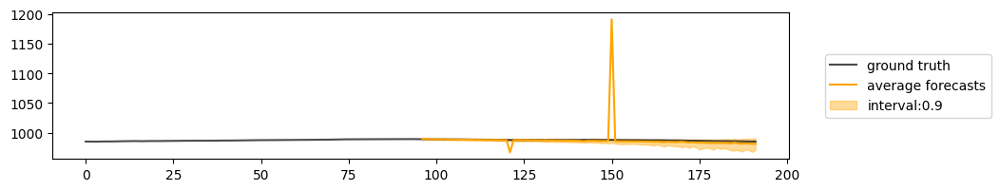

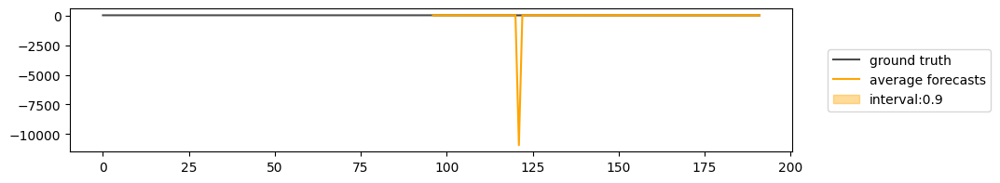

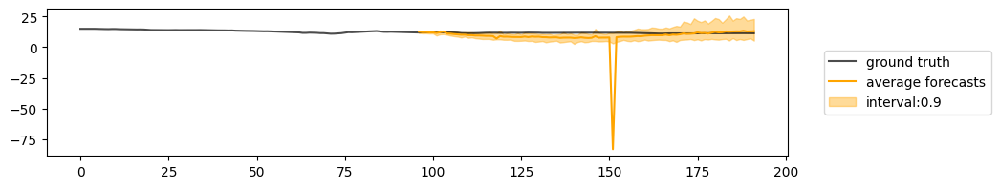

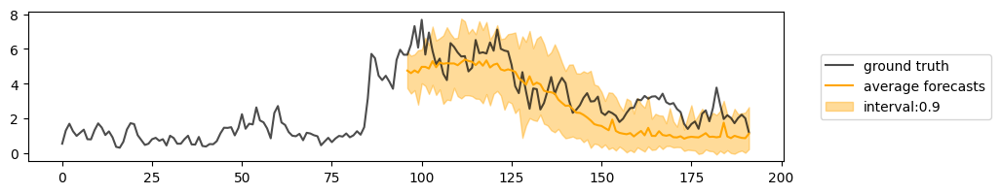

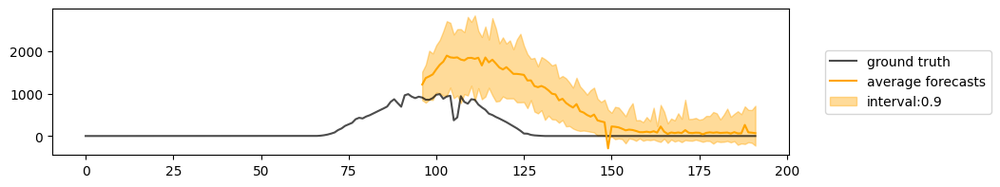

In [ ]:
model = model.to('cuda')
forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96)

### Euler

In [ ]:
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver = 'euler'
model.forecaster.prob_model.solver_num_steps = 15
model.forecaster.prob_model.solver_schedule = 'linear'

for batch in test_dataloader:
    break

In [ ]:
steps = [10, 15, 20, 30, 50, 100]
euler_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps
    euler_time.append(time_for_forecast(batch, model, n_repeats=1))
euler_time

100%|██████████| 6/6 [00:47<00:00,  7.92s/it]


[2.0223798751831055,
 3.1002652645111084,
 4.14666748046875,
 6.282257556915283,
 10.540416717529297,
 21.394052982330322]

In [ ]:
euler_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[10, 15, 20, 30, 50, 100])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:57<04:48, 57.69s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           6.120702743530273
    96_test_CRPS-Sum         11.39635944366455
      96_test_MASE           106.4892807006836
       96_test_MSE              91469216.0
     96_test_MSE-Sum           3802418432.0
       96_test_ND           0.5785165429115295
     96_test_ND-Sum         3.9226176738739014
      96_test_NRMSE         56.938873291015625
    96_test_NRMSE-Sum       17.464454650878906
   96_test_weighted_ND      0.5785165429115295
 96_test_weighted_ND-Sum    3.9226176738739014
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [02:09<04:23, 65.86s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.35071006417274475
    96_test_CRPS-Sum        0.8788210153579712
      96_test_MASE           51.06391525268555
       96_test_MSE              57389128.0
     96_test_MSE-Sum           1434854400.0
       96_test_ND           0.4478718936443329
     96_test_ND-Sum         0.4206963777542114
      96_test_NRMSE         45.063255310058594
    96_test_NRMSE-Sum       10.731460571289062
   96_test_weighted_ND      0.4478718936443329
 96_test_weighted_ND-Sum    0.4206963777542114
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [03:34<03:43, 74.49s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2655027210712433
    96_test_CRPS-Sum        0.23047645390033722
      96_test_MASE           54.41787338256836
       96_test_MSE              37077164.0
     96_test_MSE-Sum            867008576.0
       96_test_ND           0.3743477761745453
     96_test_ND-Sum         0.31813085079193115
      96_test_NRMSE          35.94144058227539
    96_test_NRMSE-Sum        8.255672454833984
   96_test_weighted_ND      0.3743477761745453
 96_test_weighted_ND-Sum    0.31813085079193115
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [05:25<02:57, 88.98s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2971808612346649
    96_test_CRPS-Sum        0.25198522210121155
      96_test_MASE           54.64893341064453
       96_test_MSE              14073458.0
     96_test_MSE-Sum            309058624.0
       96_test_ND           0.41002652049064636
     96_test_ND-Sum         0.3505803346633911
      96_test_NRMSE         20.567298889160156
    96_test_NRMSE-Sum        4.579029560089111
   96_test_weighted_ND      0.41002652049064636
 96_test_weighted_ND-Sum    0.3505803346633911
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [08:09<01:56, 116.21s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3001624047756195
    96_test_CRPS-Sum        0.2547621726989746
      96_test_MASE           51.64761734008789
       96_test_MSE              30775376.0
     96_test_MSE-Sum            650196672.0
       96_test_ND           0.4101700484752655
     96_test_ND-Sum         0.35027241706848145
      96_test_NRMSE         27.654285430908203
    96_test_NRMSE-Sum        6.050634860992432
   96_test_weighted_ND      0.4101700484752655
 96_test_weighted_ND-Sum    0.35027241706848145
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [13:07<00:00, 131.20s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.32040050625801086
    96_test_CRPS-Sum        0.2757911682128906
      96_test_MASE          52.301849365234375
       96_test_MSE              61721368.0
     96_test_MSE-Sum           1338245888.0
       96_test_ND           0.43309319019317627
     96_test_ND-Sum         0.3739030659198761
      96_test_NRMSE          33.23942184448242
    96_test_NRMSE-Sum        7.285520553588867
   96_test_weighted_ND      0.43309319019317627
 96_test_weighted_ND-Sum    0.3739030659198761
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [ ]:
import pickle
with open("euler_metrics.pkl", "wb") as fp:
   pickle.dump(euler_metrics, fp)

10


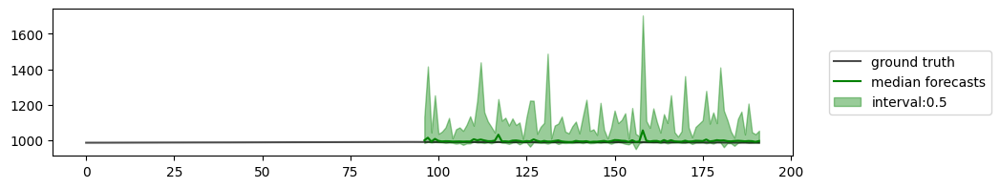

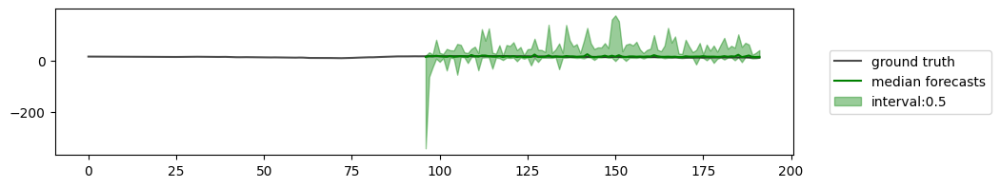

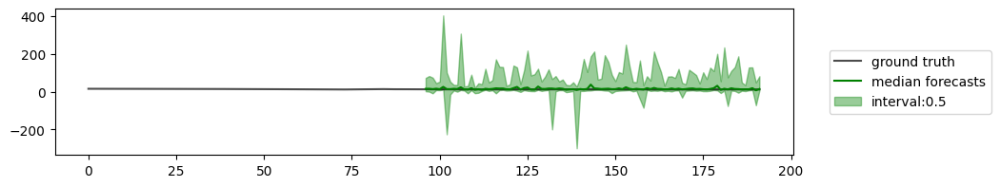

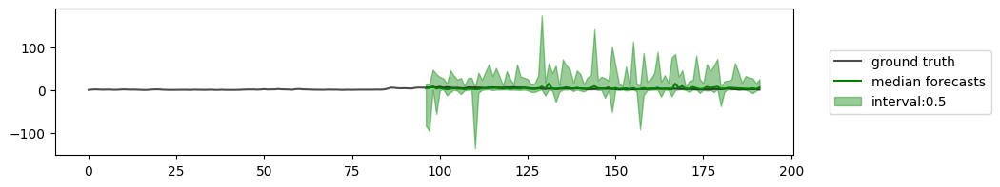

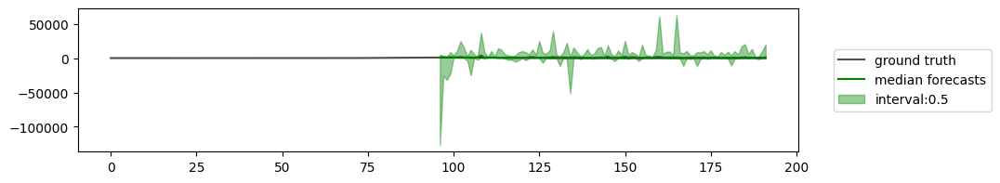

15


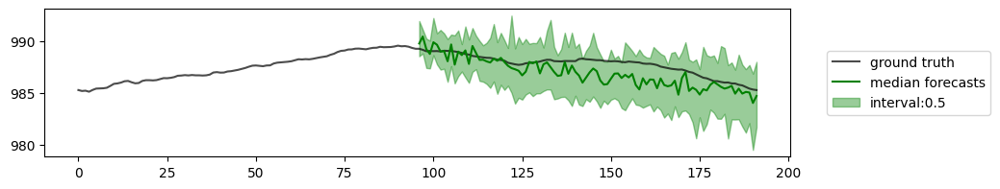

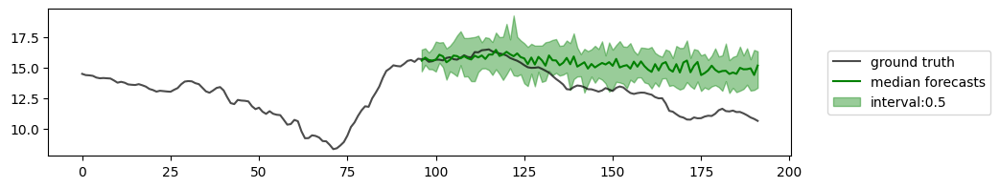

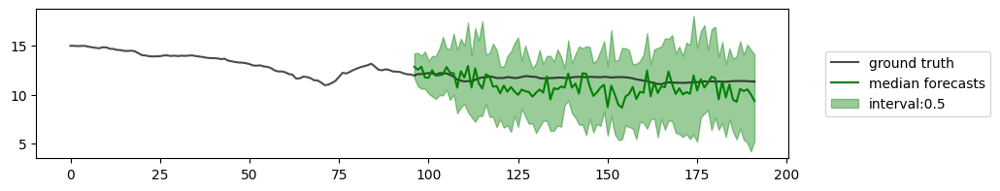

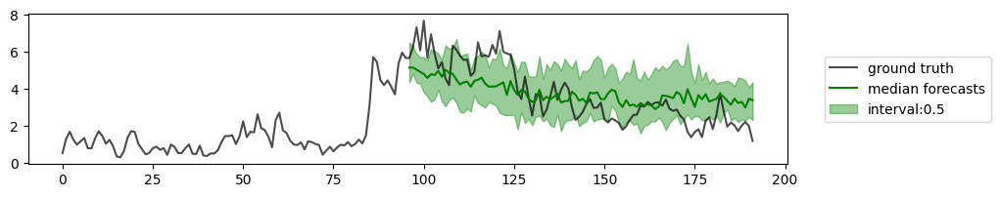

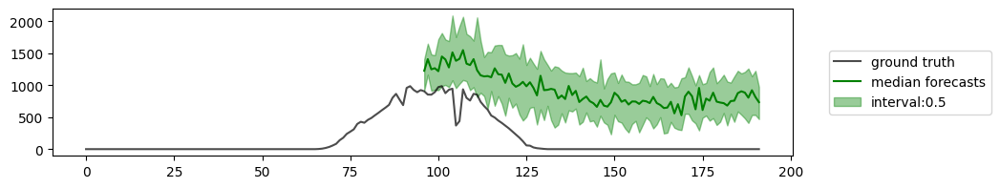

20


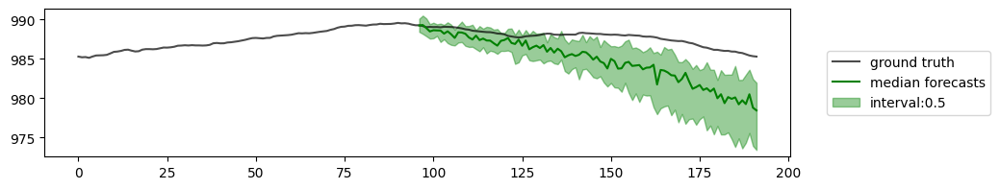

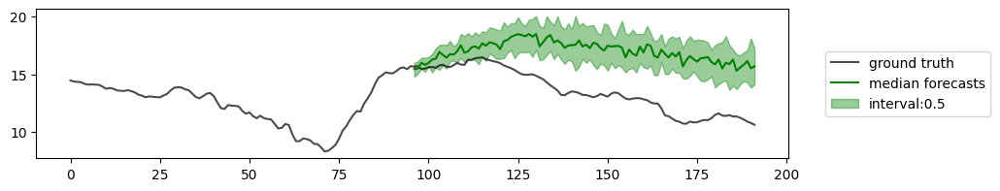

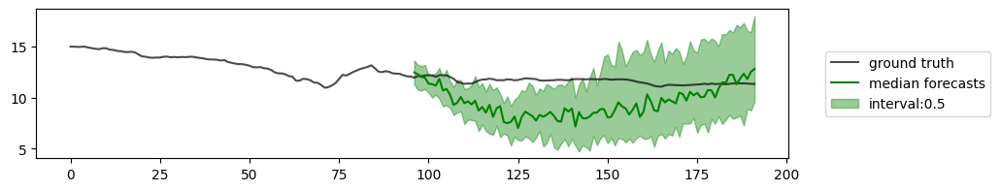

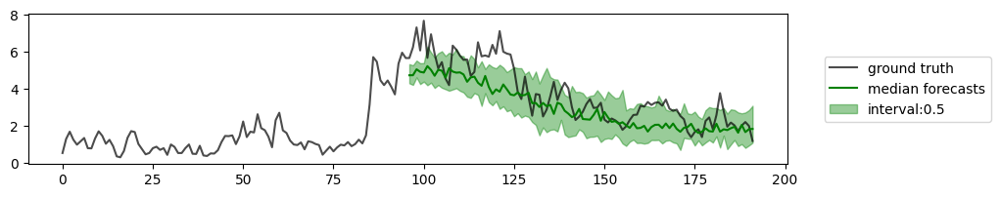

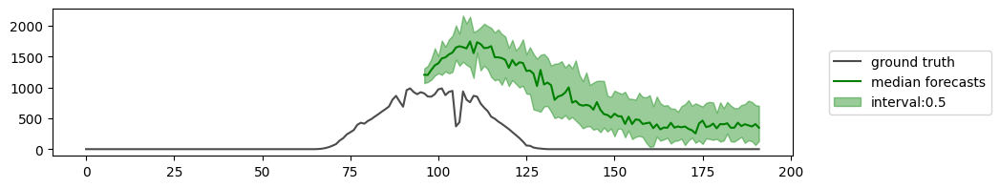

30


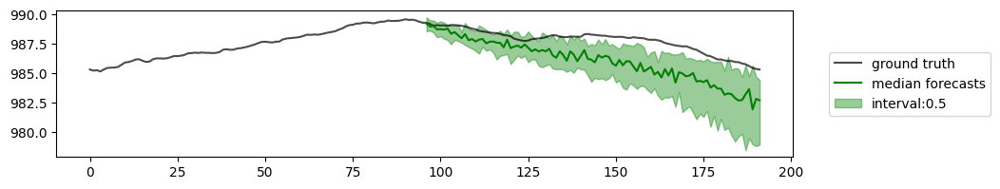

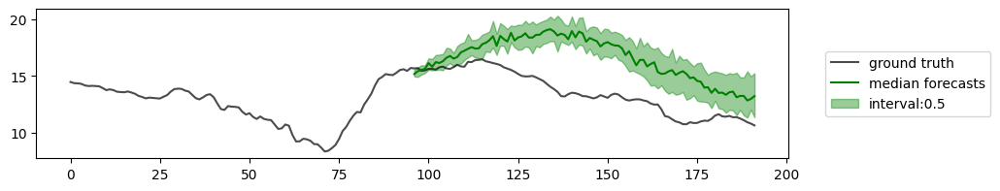

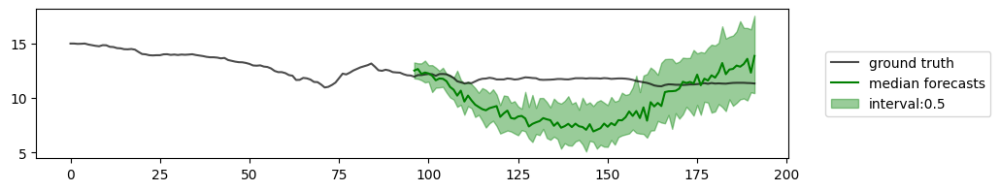

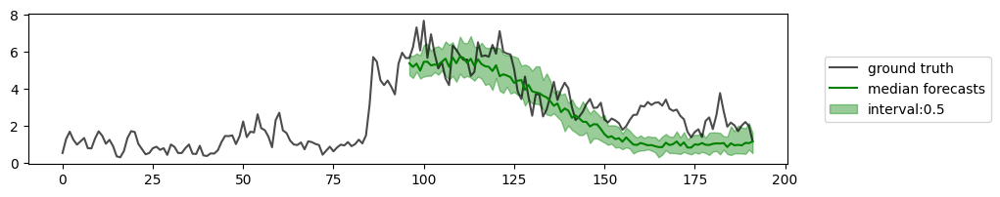

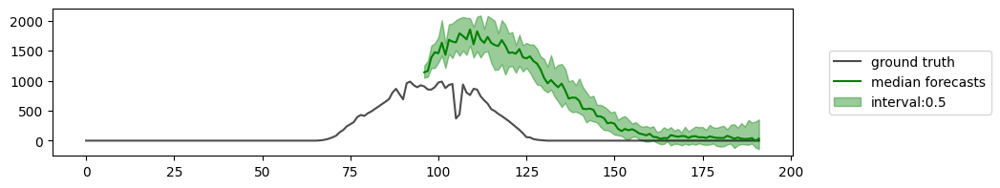

50


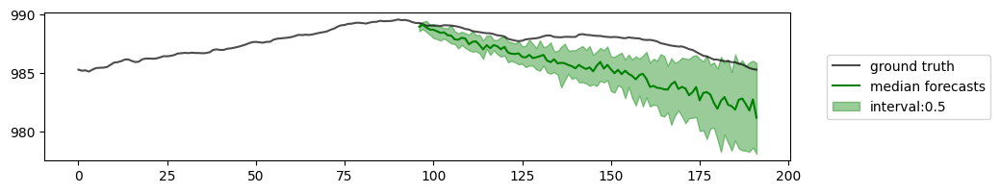

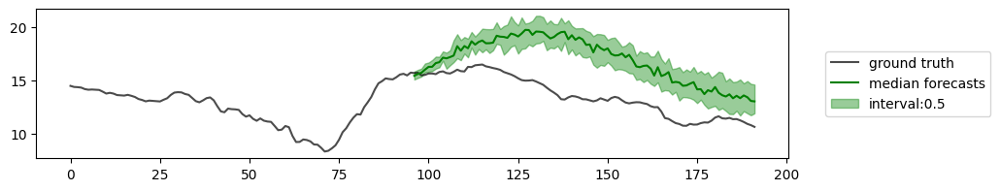

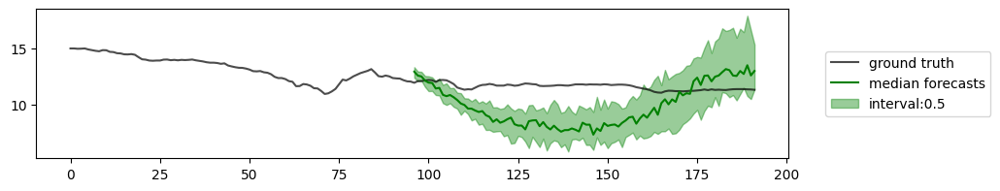

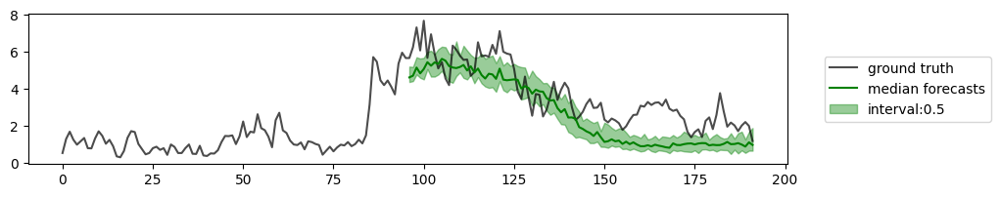

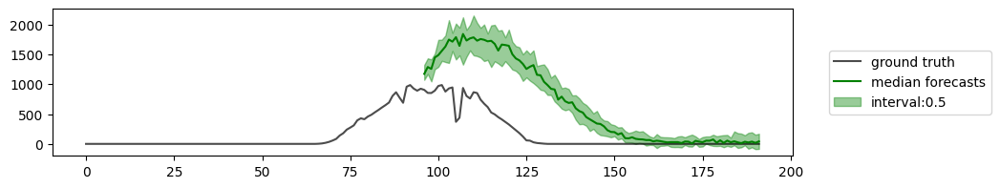

100


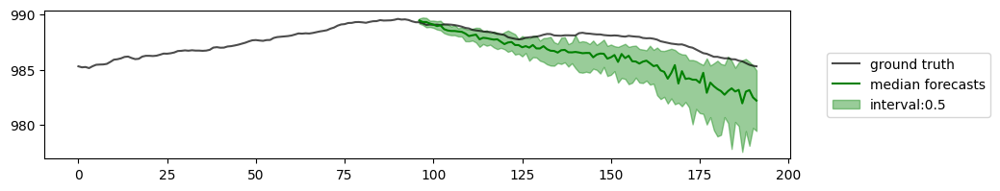

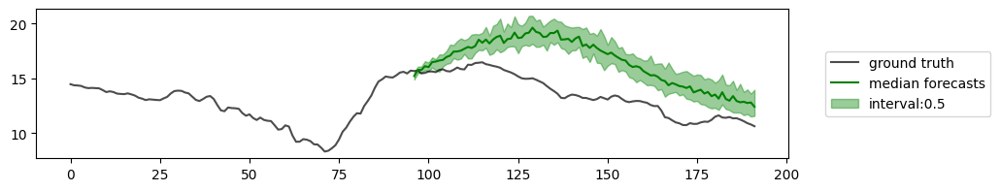

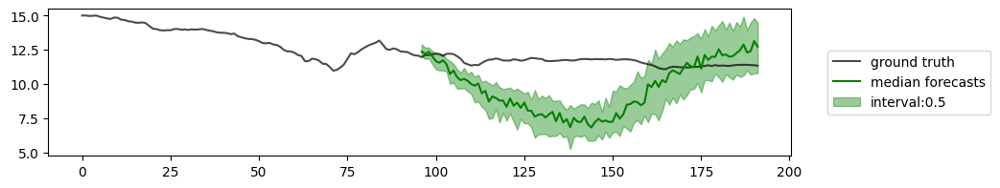

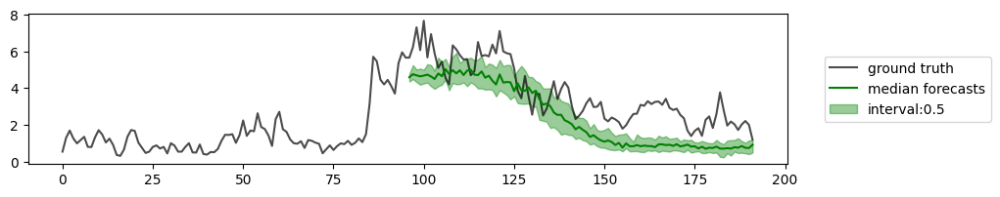

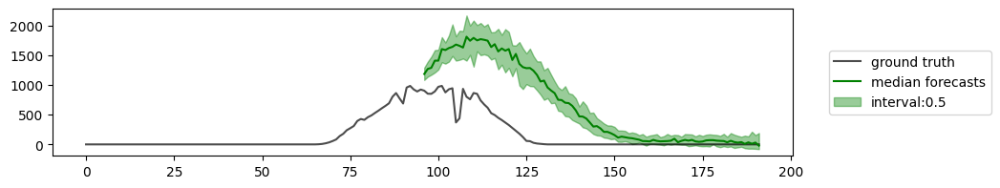

In [ ]:
model = model.to('cuda')
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96, point_type='median')
    plt.show()

### Heun

In [ ]:
model.forecaster.prob_model.solver = 'heun'
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver_num_steps = 15
model.forecaster.prob_model.solver_schedule = 'linear'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [ ]:
model = model.to('cuda')

In [ ]:
heun_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps // 2
    heun_time.append(time_for_forecast(batch, model, n_repeats=1))
heun_time

100%|██████████| 6/6 [00:46<00:00,  7.79s/it]


[1.8593530654907227,
 2.706590414047241,
 4.009337663650513,
 6.198770999908447,
 10.575291156768799,
 21.374602556228638]

In [ ]:
heun_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[step // 2 for step in steps])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:54<04:33, 54.71s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          48.246604919433594
    96_test_CRPS-Sum         47.18014907836914
      96_test_MASE           1083.63232421875
       96_test_MSE              314352960.0
     96_test_MSE-Sum           7553920512.0
       96_test_ND            5.398255825042725
     96_test_ND-Sum         13.352179527282715
      96_test_NRMSE         105.66958618164062
    96_test_NRMSE-Sum       24.637798309326172
   96_test_weighted_ND       5.398255825042725
 96_test_weighted_ND-Sum    13.352179527282715
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [02:00<04:04, 61.07s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           58.65414047241211
    96_test_CRPS-Sum         84.75585174560547
      96_test_MASE          1115.6243896484375
       96_test_MSE             2555328256.0
     96_test_MSE-Sum           83064471552.0
       96_test_ND            5.500044345855713
     96_test_ND-Sum         24.417375564575195
      96_test_NRMSE          301.1251525878906
    96_test_NRMSE-Sum        81.6457290649414
   96_test_weighted_ND       5.500044345855713
 96_test_weighted_ND-Sum    24.417375564575195
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [03:21<03:31, 70.42s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          10.640260696411133
    96_test_CRPS-Sum         44.76482009887695
      96_test_MASE           68.44671630859375
       96_test_MSE             6910524416.0
     96_test_MSE-Sum          251030896640.0
       96_test_ND           0.4026249349117279
     96_test_ND-Sum          7.613297462463379
      96_test_NRMSE          495.0112609863281
    96_test_NRMSE-Sum       141.82176208496094
   96_test_weighted_ND      0.4026249349117279
 96_test_weighted_ND-Sum     7.613297462463379
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [05:10<02:50, 85.36s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.30236098170280457
    96_test_CRPS-Sum        1.1792048215866089
      96_test_MASE          51.294708251953125
       96_test_MSE             4130090496.0
     96_test_MSE-Sum           98375802880.0
       96_test_ND           0.4203909933567047
     96_test_ND-Sum         0.3876371383666992
      96_test_NRMSE          382.329345703125
    96_test_NRMSE-Sum        88.82968139648438
   96_test_weighted_ND      0.4203909933567047
 96_test_weighted_ND-Sum    0.3876371383666992
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [07:51<01:52, 112.73s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2856591045856476
    96_test_CRPS-Sum        0.24291087687015533
      96_test_MASE           49.44257736206055
       96_test_MSE             1554282752.0
     96_test_MSE-Sum           35176718336.0
       96_test_ND           0.39534106850624084
     96_test_ND-Sum          0.339858740568161
      96_test_NRMSE         226.23854064941406
    96_test_NRMSE-Sum        51.12807083129883
   96_test_weighted_ND      0.39534106850624084
 96_test_weighted_ND-Sum     0.339858740568161
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [12:46<00:00, 127.72s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           0.307929664850235
    96_test_CRPS-Sum        0.2627756893634796
      96_test_MASE           48.95974349975586
       96_test_MSE              633907520.0
     96_test_MSE-Sum           13814990848.0
       96_test_ND           0.4167121648788452
     96_test_ND-Sum         0.3568776547908783
      96_test_NRMSE         123.46739196777344
    96_test_NRMSE-Sum        27.23166275024414
   96_test_weighted_ND      0.4167121648788452
 96_test_weighted_ND-Sum    0.3568776547908783
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [ ]:
import pickle
with open("heun_metrics.pkl", "wb") as fp:
   pickle.dump(heun_metrics, fp)

10


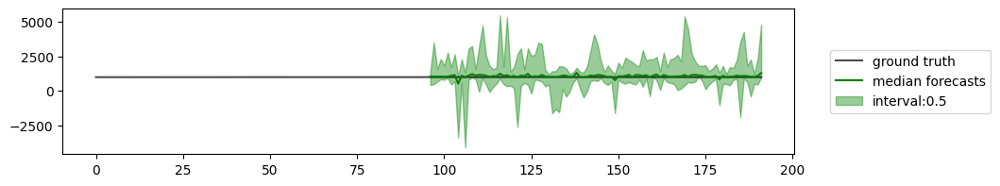

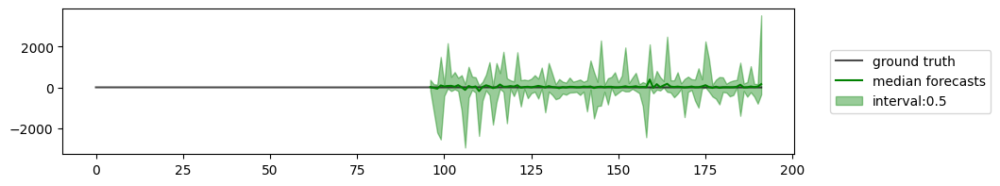

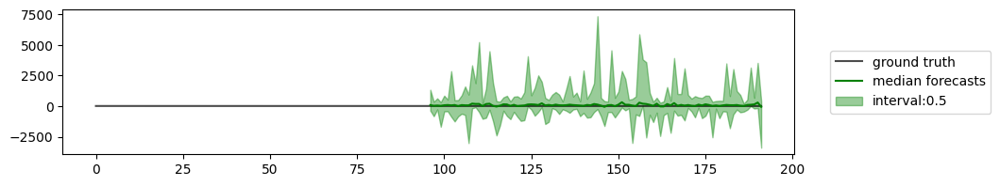

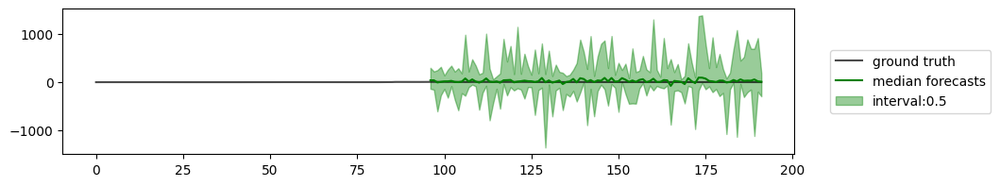

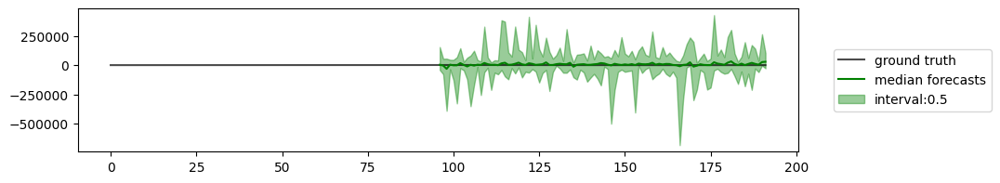

15


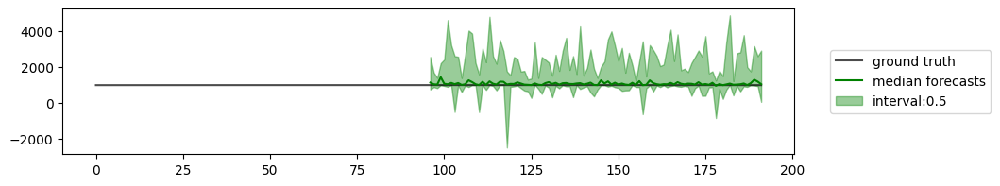

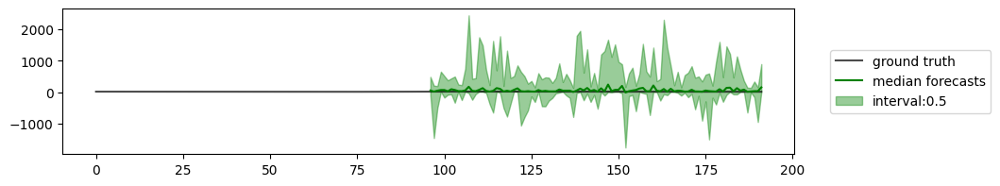

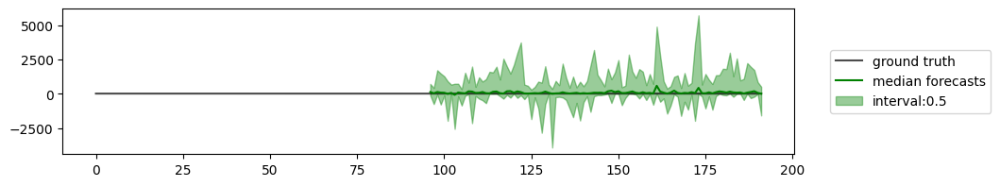

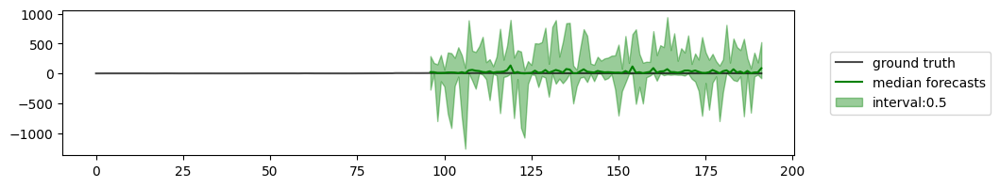

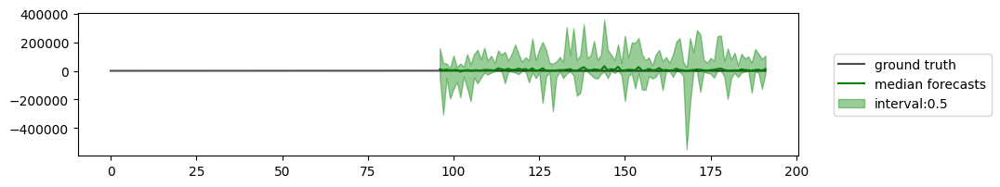

20


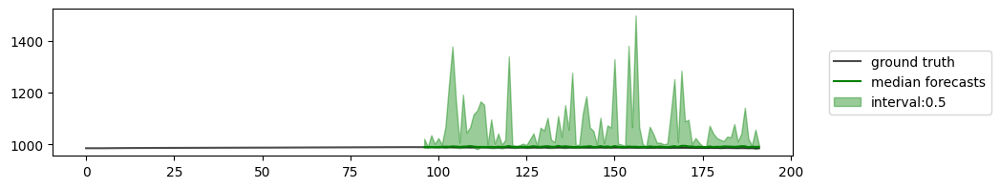

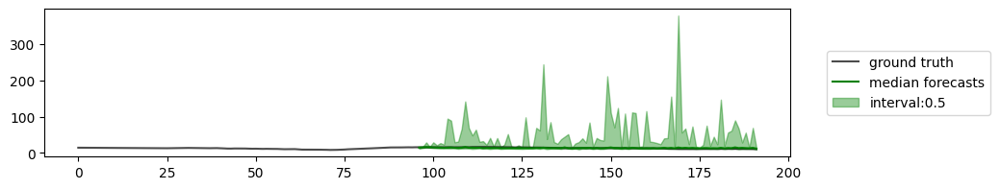

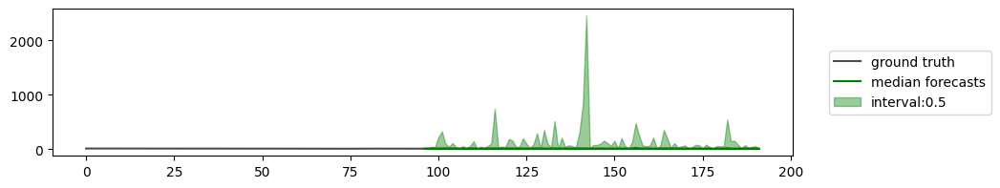

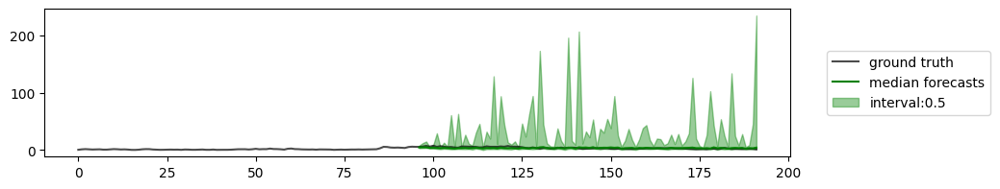

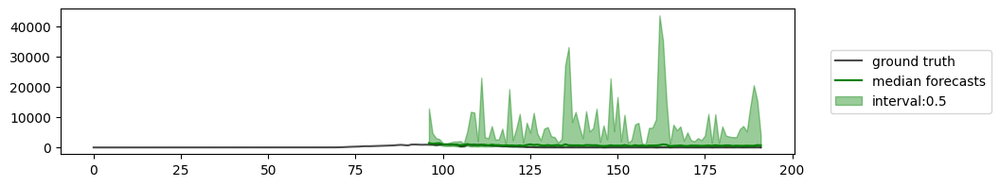

30


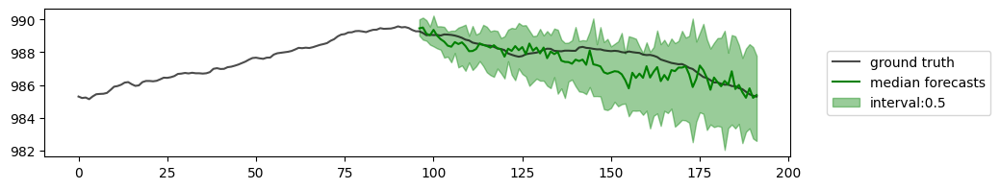

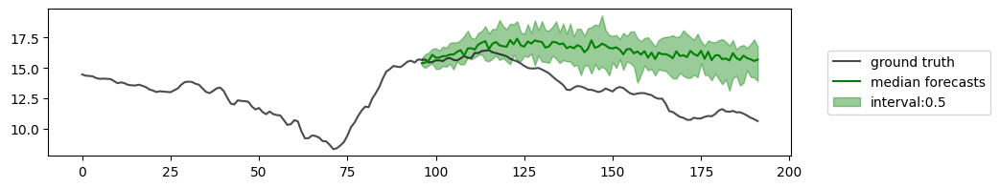

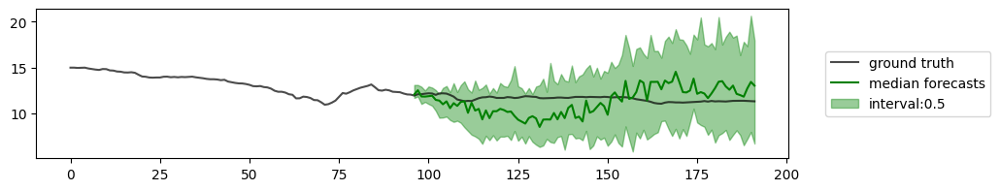

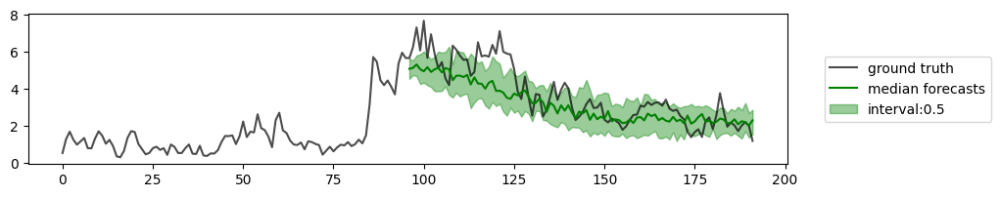

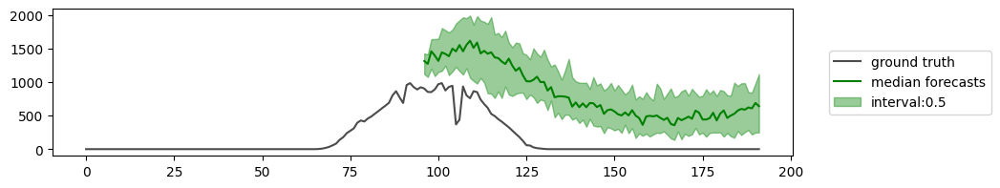

50


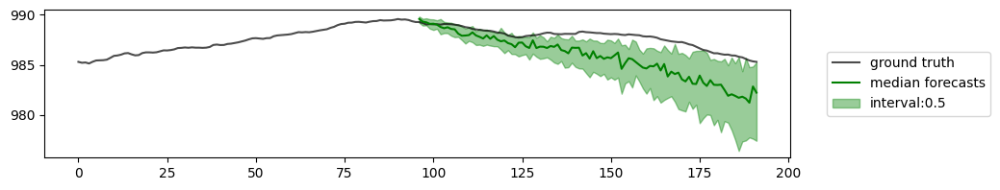

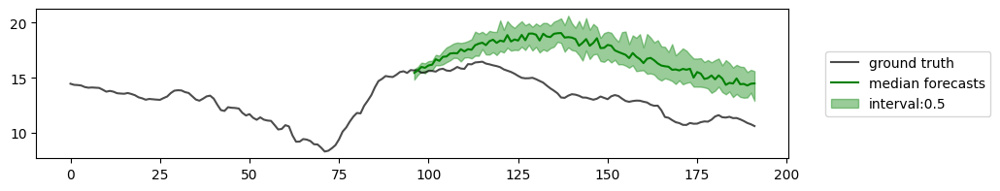

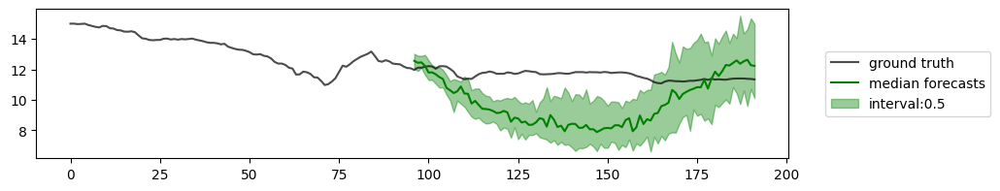

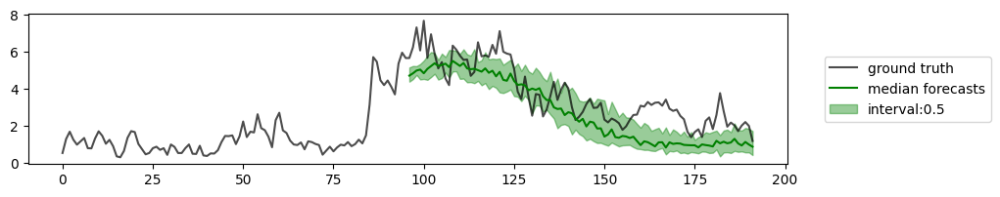

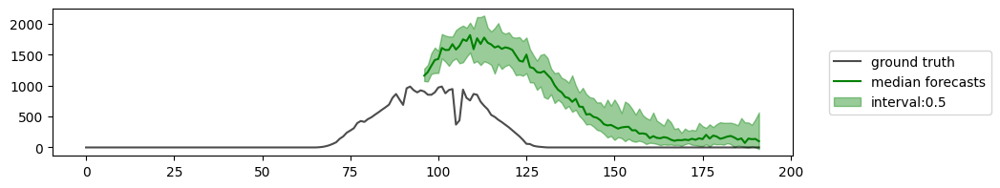

100


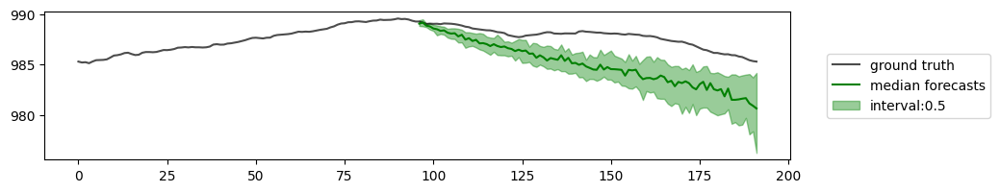

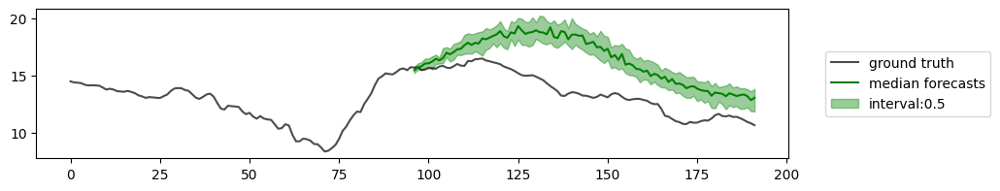

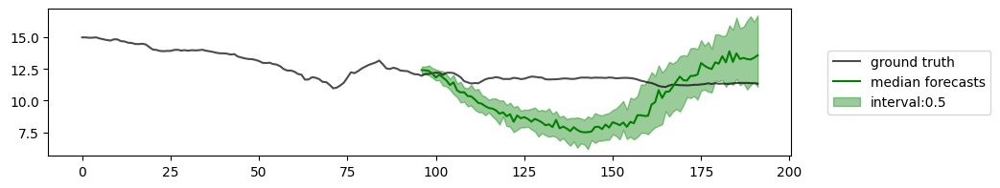

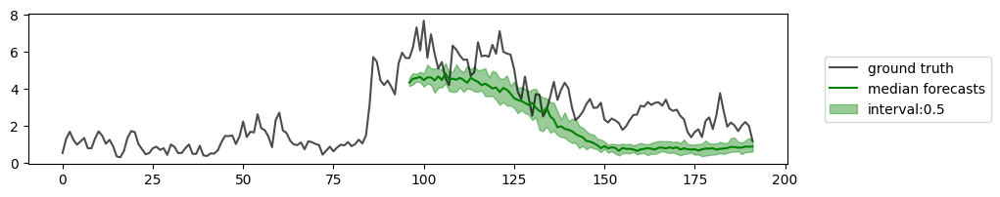

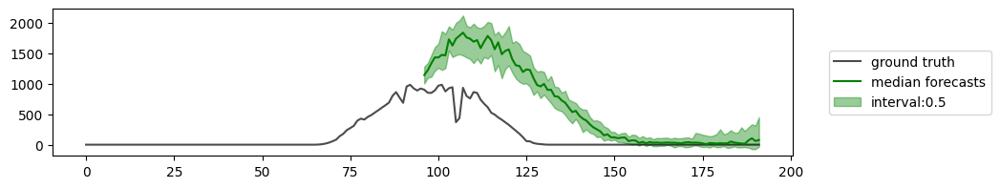

In [ ]:
model = model.to('cuda')
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps // 2
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96, point_type='median')
    plt.show()

### DDIM, quad

In [ ]:
model.forecaster.prob_model.solver = 'ddim'
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver_num_steps = 15
model.forecaster.prob_model.solver_schedule = 'quad'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [ ]:
ddim_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps
    ddim_time.append(time_for_forecast(batch, model, n_repeats=1))
ddim_time

100%|██████████| 6/6 [00:46<00:00,  7.82s/it]


[1.9978861808776855,
 3.0450592041015625,
 4.138261079788208,
 6.20475435256958,
 10.54960584640503,
 20.97203516960144]

In [ ]:
ddim_quad_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:57<04:46, 57.23s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.14481794834136963
    96_test_CRPS-Sum        0.2966967225074768
      96_test_MASE           49.7336311340332
       96_test_MSE               5702945.5
     96_test_MSE-Sum            211901616.0
       96_test_ND           0.11719856411218643
     96_test_ND-Sum         0.09011158347129822
      96_test_NRMSE          13.90152645111084
    96_test_NRMSE-Sum        4.009734153747559
   96_test_weighted_ND      0.11719856411218643
 96_test_weighted_ND-Sum    0.09011158347129822
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [02:07<04:19, 64.90s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.15651345252990723
    96_test_CRPS-Sum        0.12881840765476227
      96_test_MASE           50.48284912109375
       96_test_MSE               9193573.0
     96_test_MSE-Sum            219930224.0
       96_test_ND           0.19930337369441986
     96_test_ND-Sum         0.1420561969280243
      96_test_NRMSE         16.381813049316406
    96_test_NRMSE-Sum       3.8339755535125732
   96_test_weighted_ND      0.19930337369441986
 96_test_weighted_ND-Sum    0.1420561969280243
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [03:30<03:39, 73.11s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.18207238614559174
    96_test_CRPS-Sum        0.14228908717632294
      96_test_MASE          44.489261627197266
       96_test_MSE               9829601.0
     96_test_MSE-Sum            217542480.0
       96_test_ND           0.24372988939285278
     96_test_ND-Sum         0.19079439342021942
      96_test_NRMSE         16.655376434326172
    96_test_NRMSE-Sum        3.749145746231079
   96_test_weighted_ND      0.24372988939285278
 96_test_weighted_ND-Sum    0.19079439342021942
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [05:20<02:55, 87.79s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.20830892026424408
    96_test_CRPS-Sum        0.1649734228849411
      96_test_MASE          47.618282318115234
       96_test_MSE              14231649.0
     96_test_MSE-Sum            309047168.0
       96_test_ND           0.28230276703834534
     96_test_ND-Sum         0.22868013381958008
      96_test_NRMSE          19.72062873840332
    96_test_NRMSE-Sum        4.382327556610107
   96_test_weighted_ND      0.28230276703834534
 96_test_weighted_ND-Sum    0.22868013381958008
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [08:01<01:54, 114.24s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.22334402799606323
    96_test_CRPS-Sum        0.18014317750930786
      96_test_MASE           47.31602096557617
       96_test_MSE              19769466.0
     96_test_MSE-Sum            435965312.0
       96_test_ND           0.30702319741249084
     96_test_ND-Sum         0.2534750998020172
      96_test_NRMSE         23.048845291137695
    96_test_NRMSE-Sum        5.152047634124756
   96_test_weighted_ND      0.30702319741249084
 96_test_weighted_ND-Sum    0.2534750998020172
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [12:53<00:00, 128.93s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2397528737783432
    96_test_CRPS-Sum        0.19676287472248077
      96_test_MASE           48.36024856567383
       96_test_MSE              29261066.0
     96_test_MSE-Sum            631495744.0
       96_test_ND           0.33439648151397705
     96_test_ND-Sum         0.27981576323509216
      96_test_NRMSE         27.785232543945312
    96_test_NRMSE-Sum       6.1546759605407715
   96_test_weighted_ND      0.33439648151397705
 96_test_weighted_ND-Sum    0.27981576323509216
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [ ]:
with open("ddim_quad_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_quad_metrics, fp)

10


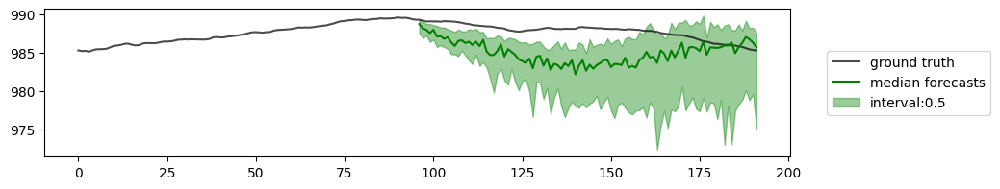

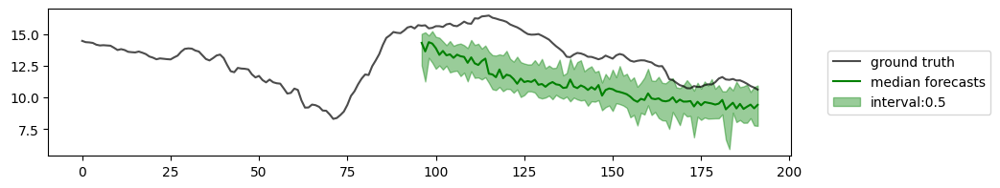

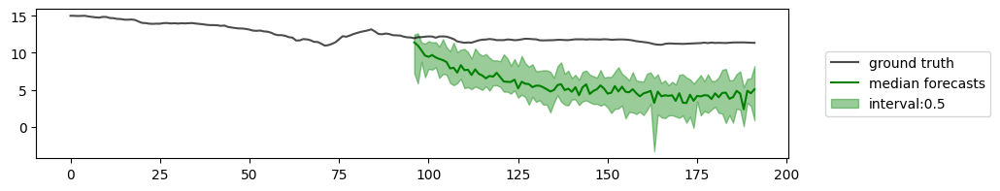

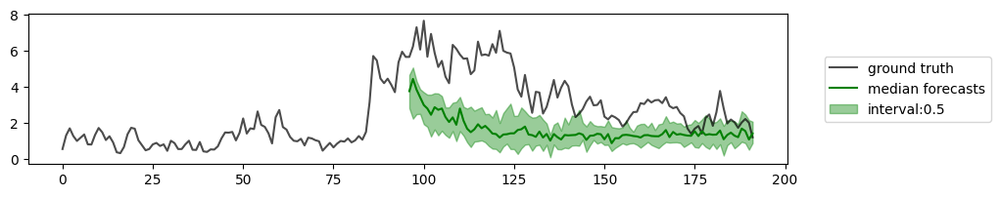

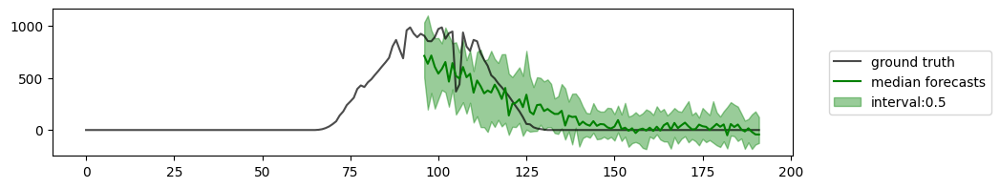

15


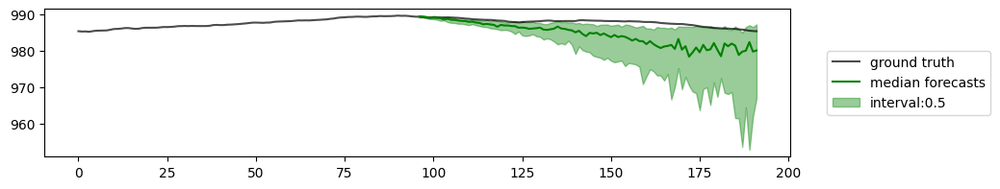

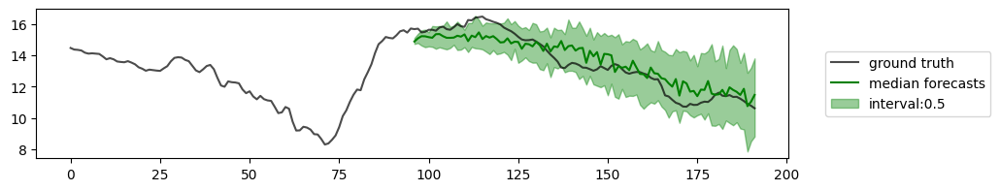

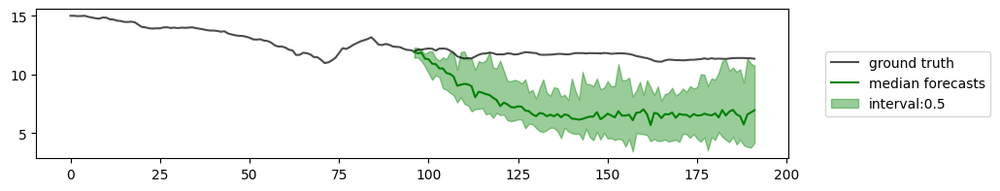

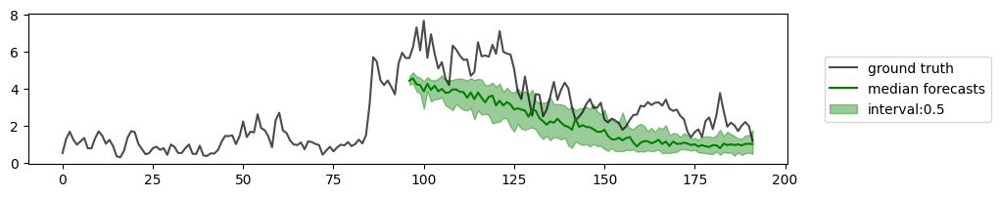

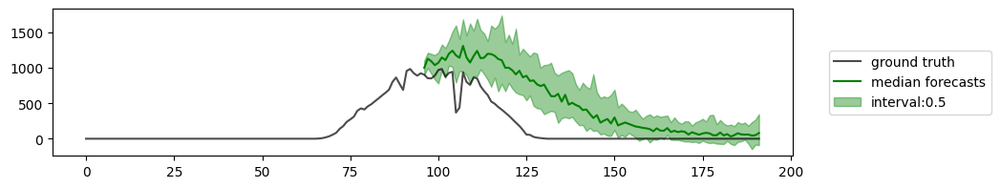

20


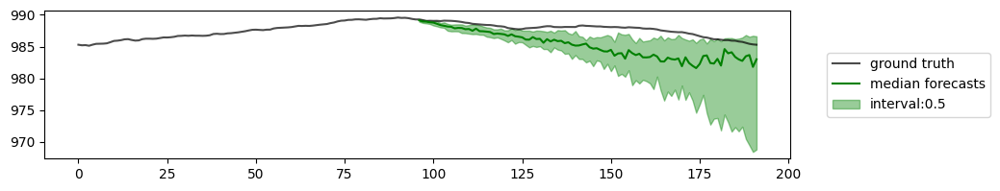

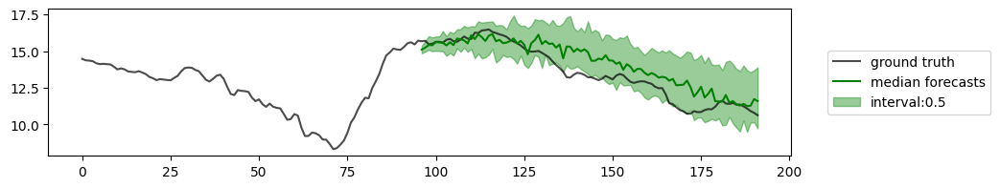

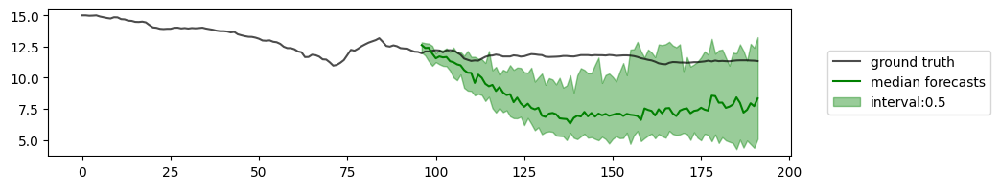

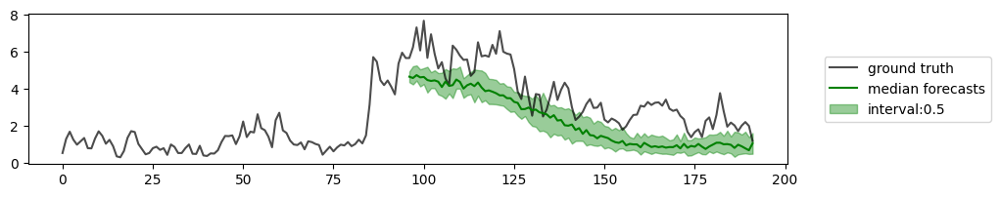

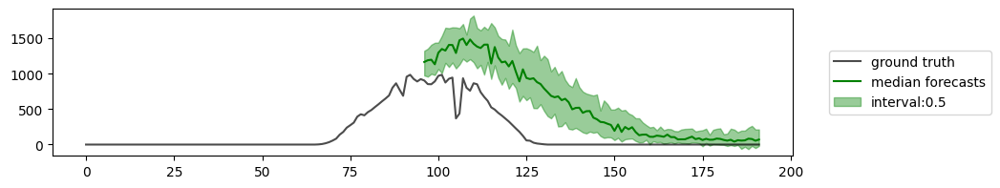

30


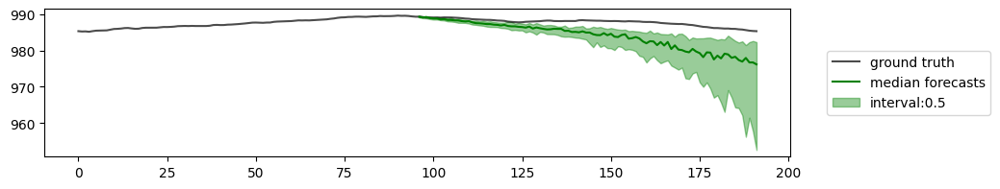

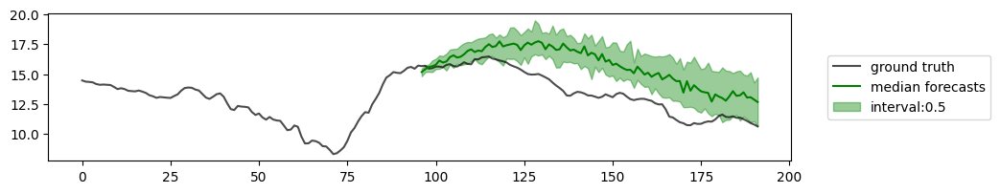

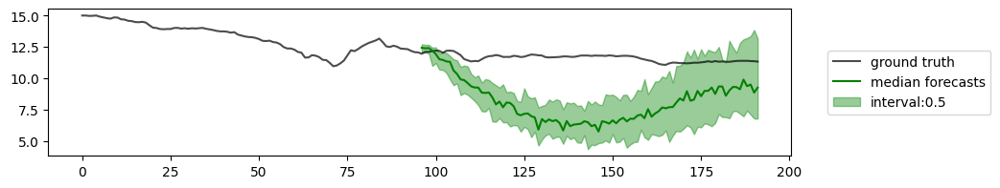

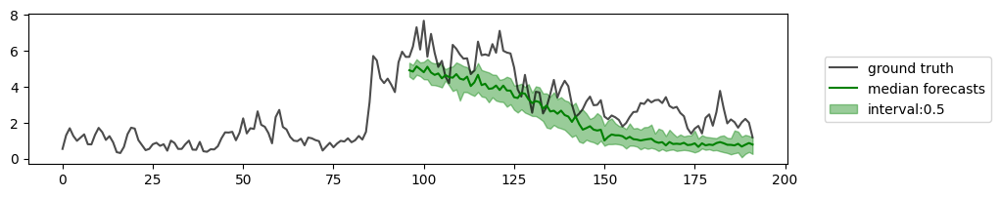

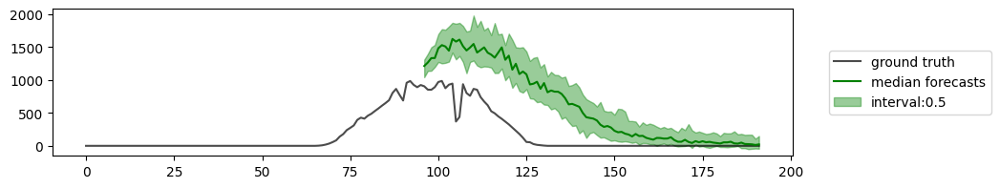

50


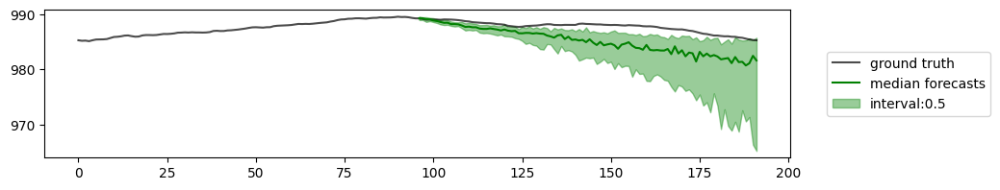

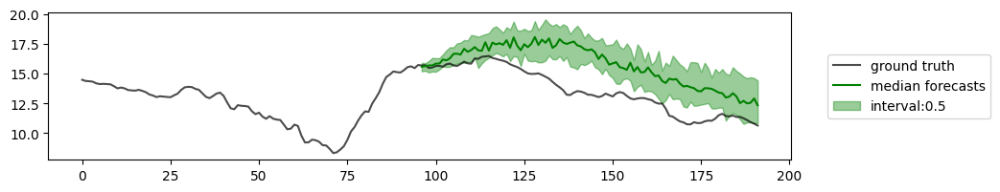

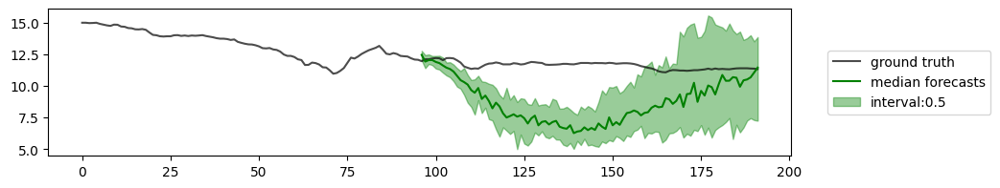

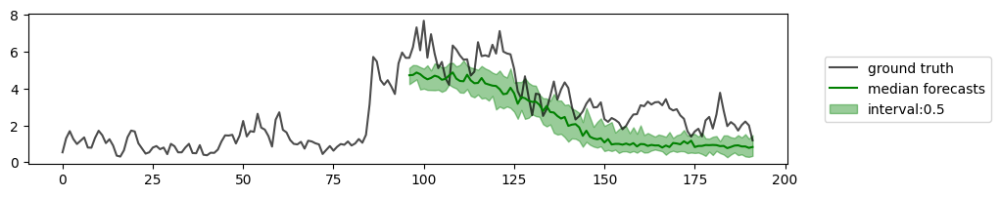

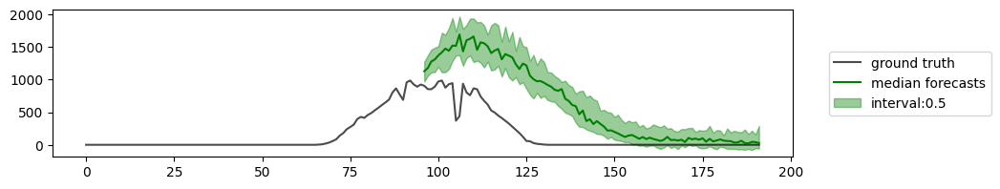

100


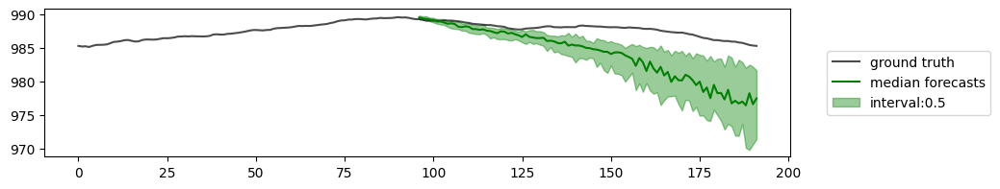

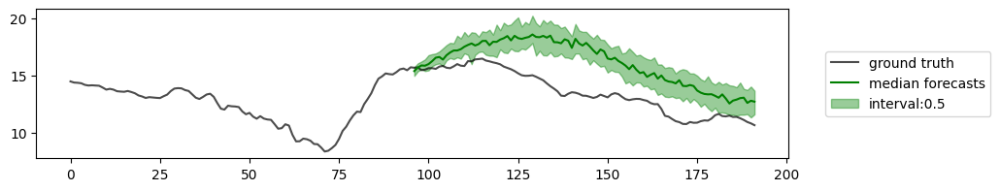

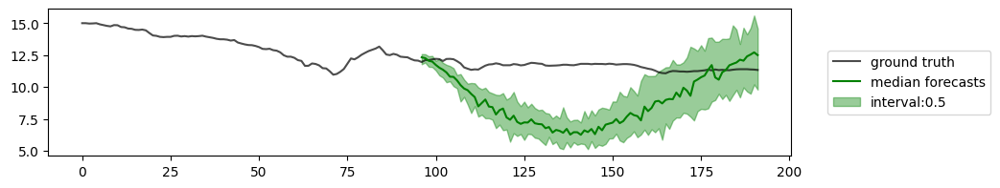

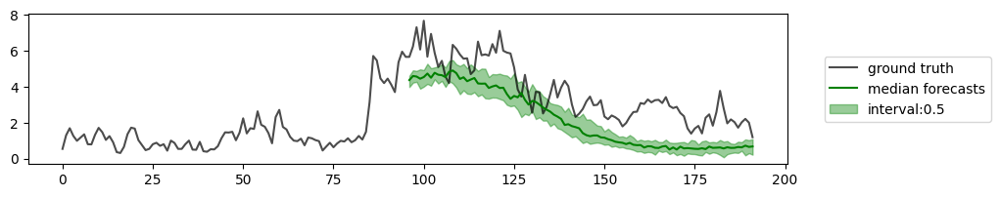

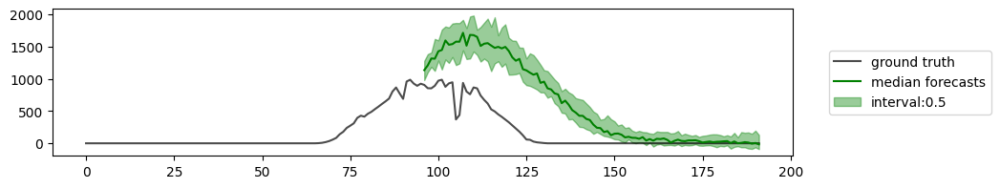

In [ ]:
model = model.to('cuda')
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96, point_type='median')
    plt.show()

### DDIM, linear

In [ ]:
model.forecaster.prob_model.solver_schedule = 'linear'

10


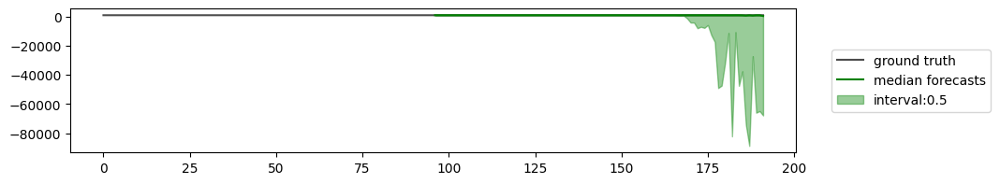

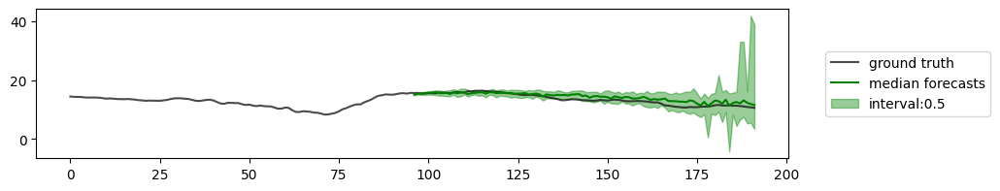

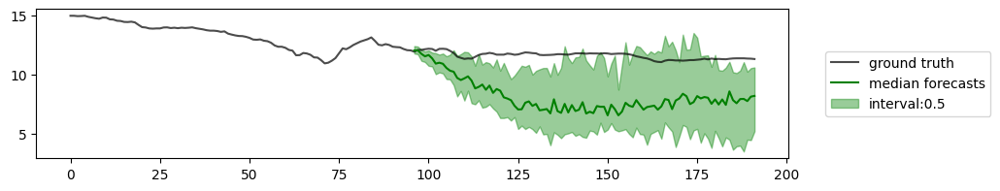

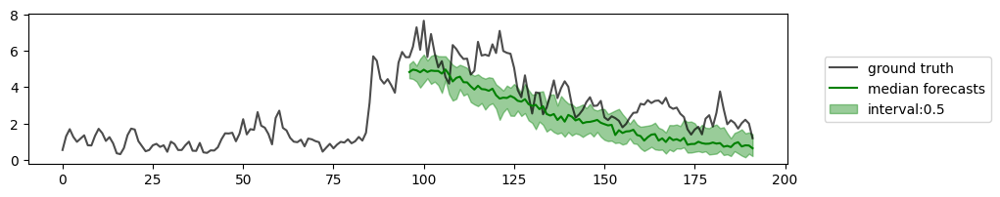

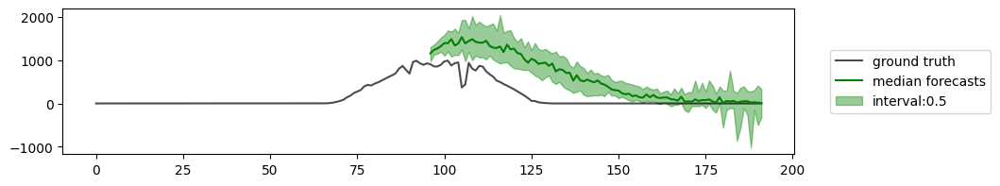

15


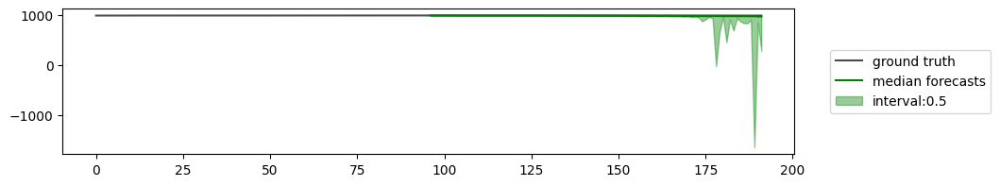

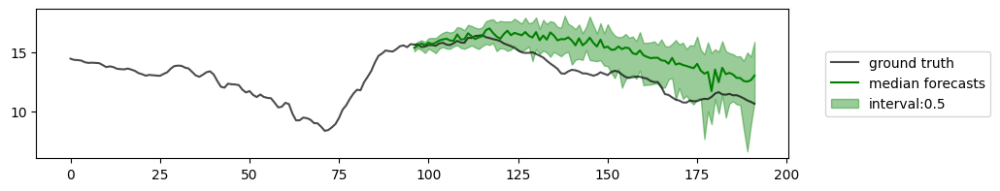

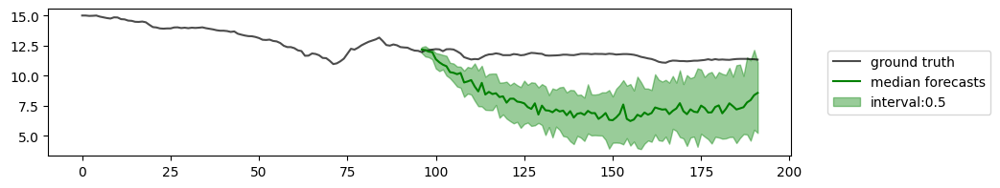

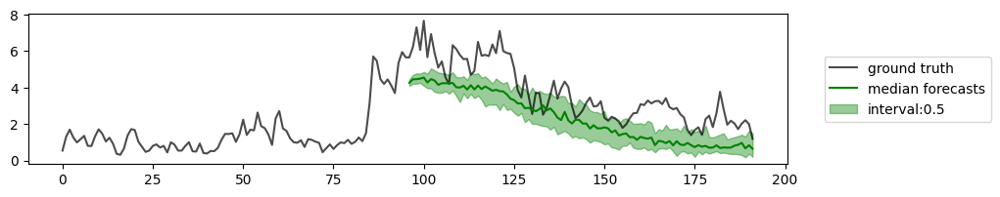

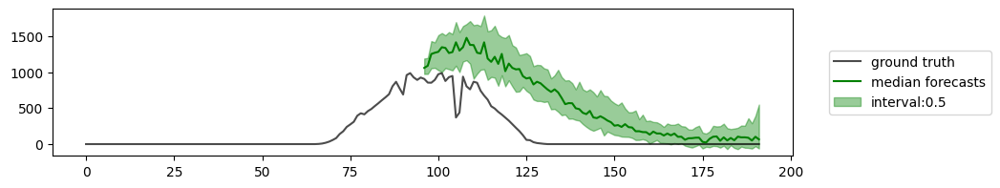

20


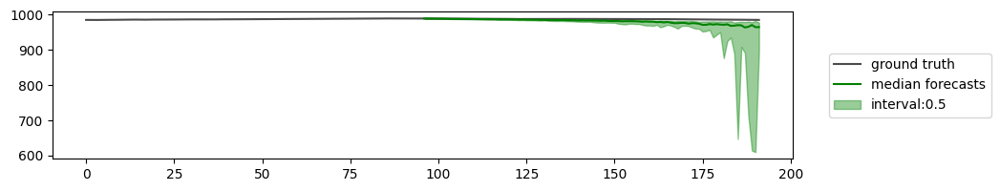

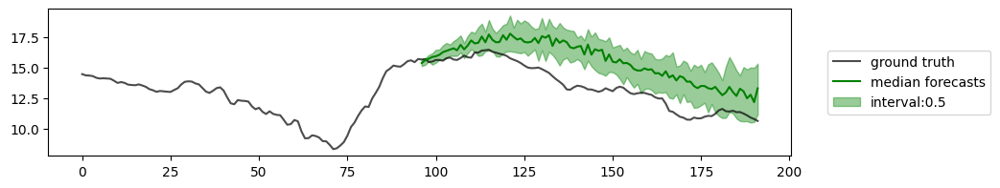

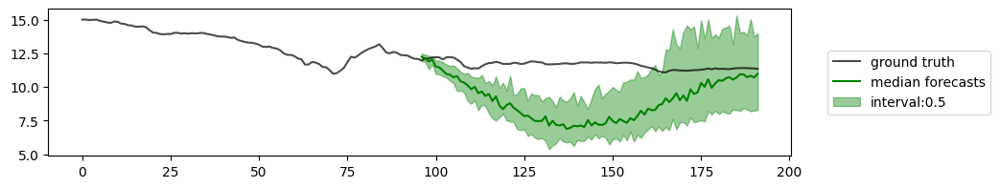

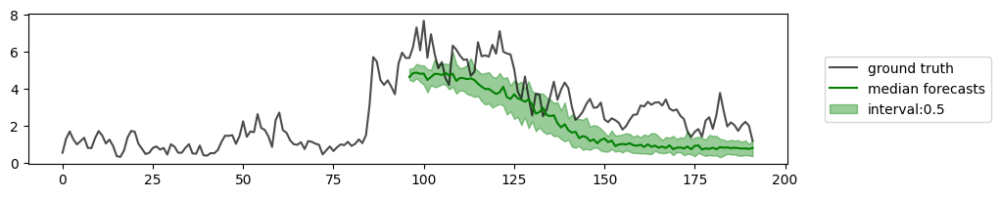

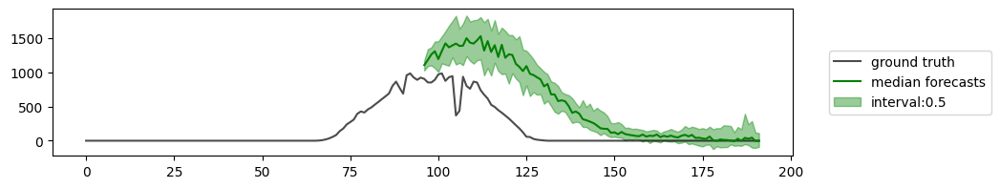

30


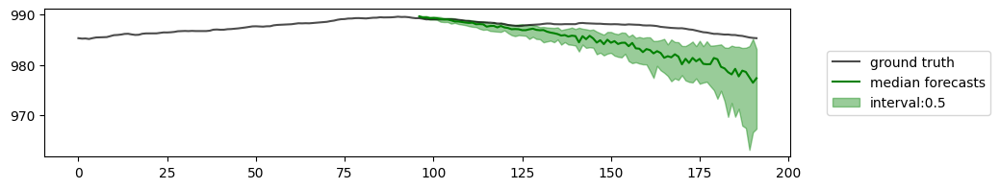

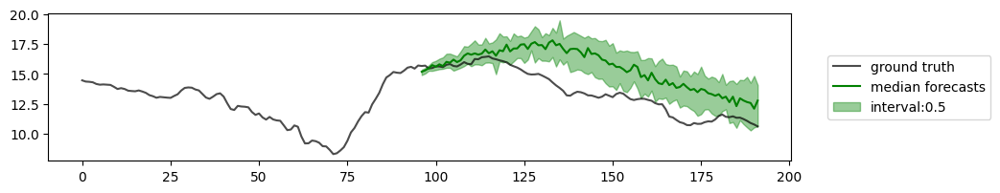

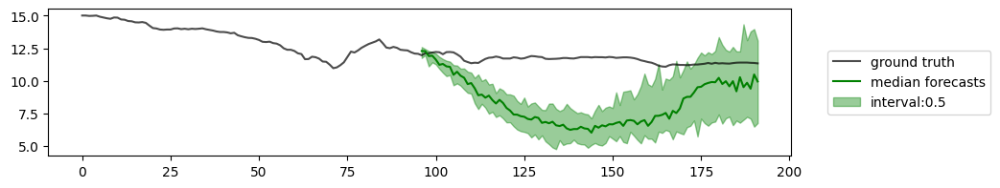

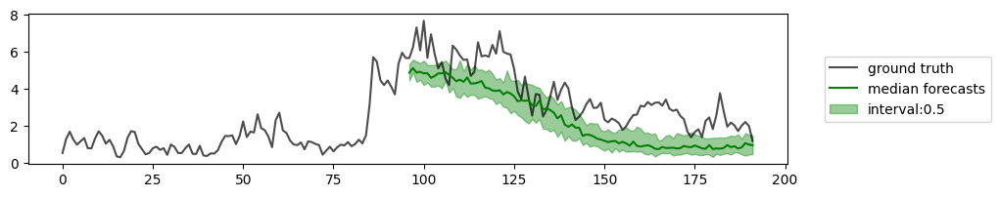

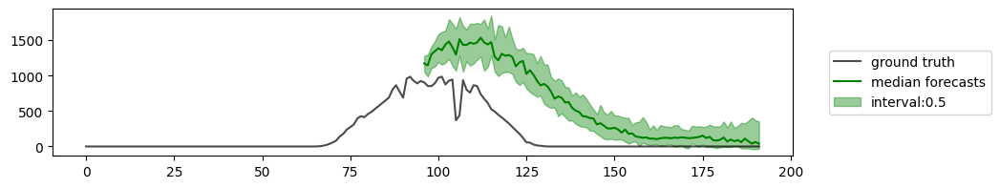

50


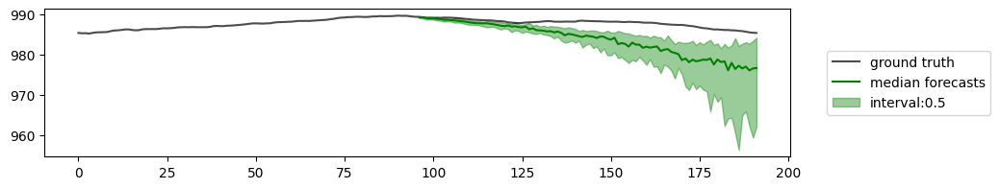

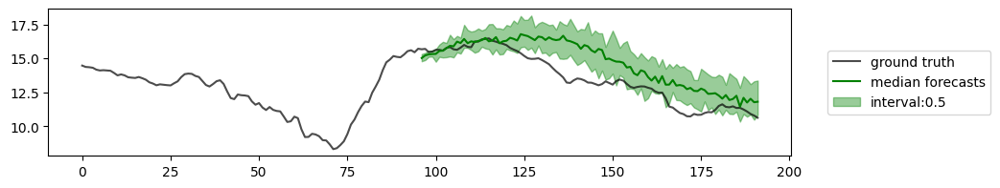

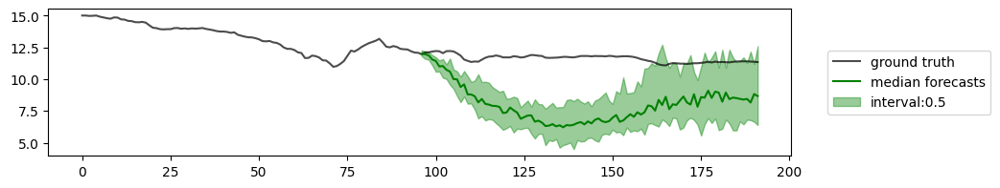

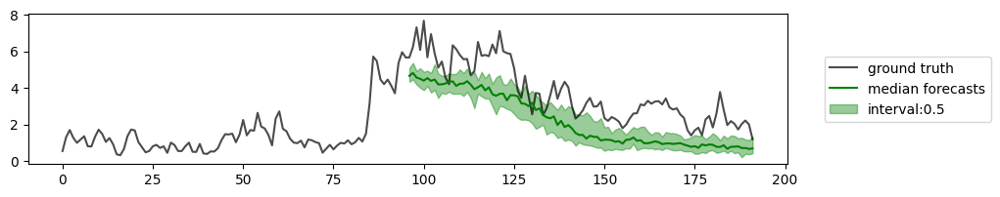

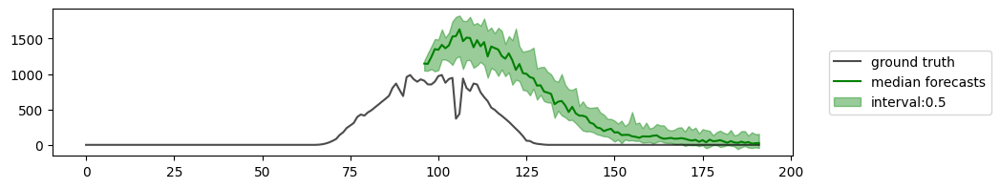

100


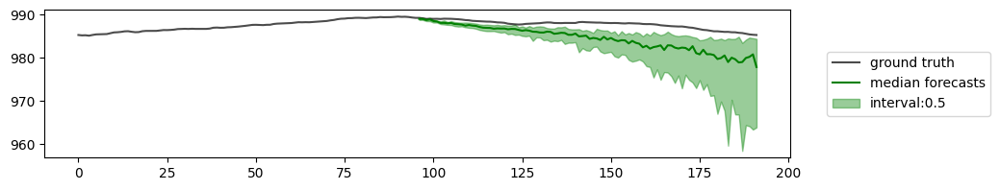

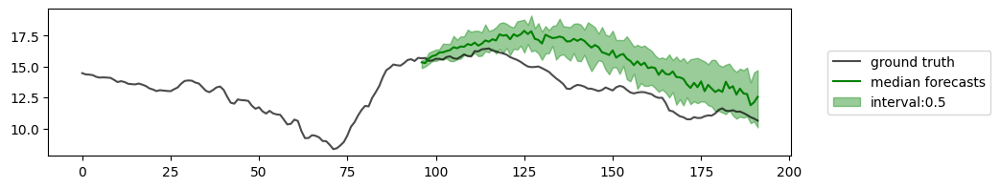

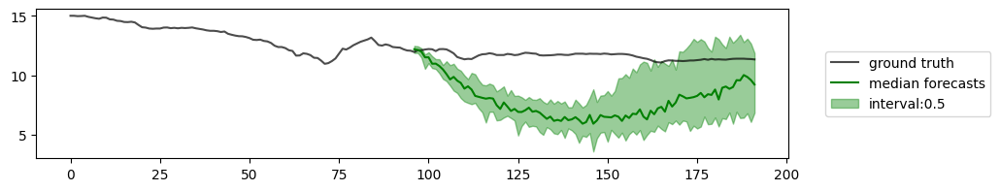

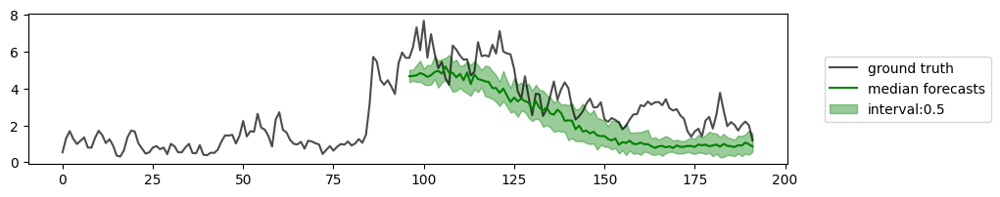

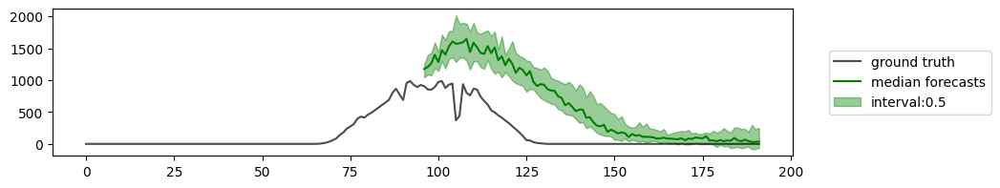

In [ ]:
model.forecaster.prob_model.solver_schedule = 'linear'

model = model.to('cuda')
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96, point_type='median')
    plt.show()

In [ ]:
ddim_linear_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:57<04:47, 57.43s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.37334123253822327
    96_test_CRPS-Sum        0.6287064552307129
      96_test_MASE          183.40817260742188
       96_test_MSE              886641600.0
     96_test_MSE-Sum           20845232128.0
       96_test_ND           0.2776237428188324
     96_test_ND-Sum         0.17633847892284393
      96_test_NRMSE         159.19105529785156
    96_test_NRMSE-Sum        36.46822738647461
   96_test_weighted_ND      0.2776237428188324
 96_test_weighted_ND-Sum    0.17633847892284393
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [02:07<04:19, 64.80s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.1984395533800125
    96_test_CRPS-Sum        0.17504116892814636
      96_test_MASE           53.11082458496094
       96_test_MSE             1148713600.0
     96_test_MSE-Sum           25493315584.0
       96_test_ND           0.2570754587650299
     96_test_ND-Sum         0.18646949529647827
      96_test_NRMSE          176.2246856689453
    96_test_NRMSE-Sum       39.719268798828125
   96_test_weighted_ND      0.2570754587650299
 96_test_weighted_ND-Sum    0.18646949529647827
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [03:30<03:38, 72.94s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.20483841001987457
    96_test_CRPS-Sum        0.16685500741004944
      96_test_MASE           50.02305603027344
       96_test_MSE             1375607168.0
     96_test_MSE-Sum           31019554816.0
       96_test_ND           0.2715081572532654
     96_test_ND-Sum         0.2108955681324005
      96_test_NRMSE          200.2616424560547
    96_test_NRMSE-Sum       45.272361755371094
   96_test_weighted_ND      0.2715081572532654
 96_test_weighted_ND-Sum    0.2108955681324005
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [05:19<02:54, 87.26s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2200644314289093
    96_test_CRPS-Sum        0.1787877231836319
      96_test_MASE           49.30080032348633
       96_test_MSE             1638097408.0
     96_test_MSE-Sum           38150463488.0
       96_test_ND           0.29726260900497437
     96_test_ND-Sum         0.24216602742671967
      96_test_NRMSE         208.67466735839844
    96_test_NRMSE-Sum       47.673702239990234
   96_test_weighted_ND      0.29726260900497437
 96_test_weighted_ND-Sum    0.24216602742671967
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [08:00<01:53, 113.81s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.21448826789855957
    96_test_CRPS-Sum        0.17233030498027802
      96_test_MASE           47.99391555786133
       96_test_MSE             2407935488.0
     96_test_MSE-Sum           52248981504.0
       96_test_ND           0.28826478123664856
     96_test_ND-Sum         0.23452246189117432
      96_test_NRMSE          261.4618835449219
    96_test_NRMSE-Sum        57.76618576049805
   96_test_weighted_ND      0.28826478123664856
 96_test_weighted_ND-Sum    0.23452246189117432
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [12:49<00:00, 128.30s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2303173691034317
    96_test_CRPS-Sum        0.18683934211730957
      96_test_MASE           47.68715286254883
       96_test_MSE             2355205632.0
     96_test_MSE-Sum           52985229312.0
       96_test_ND           0.3162764310836792
     96_test_ND-Sum          0.261813759803772
      96_test_NRMSE         252.18255615234375
    96_test_NRMSE-Sum       56.849361419677734
   96_test_weighted_ND      0.3162764310836792
 96_test_weighted_ND-Sum     0.261813759803772
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [ ]:
with open("ddim_linear_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_linear_metrics, fp)

### DPM-Solver-1

In [ ]:
model.forecaster.prob_model.solver = 'dpm1'
model.scaler = data_manager.scaler
model.forecaster.prob_model.solver_num_steps = 15
model.forecaster.prob_model.solver_schedule = 'linear'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [ ]:
model = model.to('cuda')
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:45<00:00,  7.58s/it]


[1.9622173309326172,
 2.9784963130950928,
 4.009723901748657,
 6.048892259597778,
 10.118658304214478,
 20.328583002090454]

In [ ]:
dpm1_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:56<04:41, 56.29s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           0.352785587310791
    96_test_CRPS-Sum        0.6111680269241333
      96_test_MASE           128.0427703857422
       96_test_MSE              910393280.0
     96_test_MSE-Sum           21313107968.0
       96_test_ND           0.2533869743347168
     96_test_ND-Sum         0.15186871588230133
      96_test_NRMSE          164.2969207763672
    96_test_NRMSE-Sum       37.759063720703125
   96_test_weighted_ND      0.2533869743347168
 96_test_weighted_ND-Sum    0.15186871588230133
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [02:05<04:14, 63.68s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.1988988220691681
    96_test_CRPS-Sum        0.17494511604309082
      96_test_MASE           53.60114288330078
       96_test_MSE              937990912.0
     96_test_MSE-Sum           21826953216.0
       96_test_ND           0.25733864307403564
     96_test_ND-Sum         0.18734396994113922
      96_test_NRMSE          165.1390838623047
    96_test_NRMSE-Sum       37.753543853759766
   96_test_weighted_ND      0.25733864307403564
 96_test_weighted_ND-Sum    0.18734396994113922
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [03:26<03:35, 71.98s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.20416389405727386
    96_test_CRPS-Sum        0.16532796621322632
      96_test_MASE          49.809234619140625
       96_test_MSE             1360062080.0
     96_test_MSE-Sum           30173933568.0
       96_test_ND           0.2713916003704071
     96_test_ND-Sum         0.21125048398971558
      96_test_NRMSE         196.87139892578125
    96_test_NRMSE-Sum        44.25375747680664
   96_test_weighted_ND      0.2713916003704071
 96_test_weighted_ND-Sum    0.21125048398971558
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [05:13<02:51, 85.80s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.21688415110111237
    96_test_CRPS-Sum        0.17635191977024078
      96_test_MASE           48.79842758178711
       96_test_MSE             1572827776.0
     96_test_MSE-Sum           34878418944.0
       96_test_ND           0.2941025197505951
     96_test_ND-Sum         0.24013301730155945
      96_test_NRMSE         205.24415588378906
    96_test_NRMSE-Sum        46.02640151977539
   96_test_weighted_ND      0.2941025197505951
 96_test_weighted_ND-Sum    0.24013301730155945
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [07:52<01:52, 112.04s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2140737920999527
    96_test_CRPS-Sum        0.17178356647491455
      96_test_MASE          48.047706604003906
       96_test_MSE             2384594432.0
     96_test_MSE-Sum           50371866624.0
       96_test_ND           0.28896427154541016
     96_test_ND-Sum         0.23474034667015076
      96_test_NRMSE          255.5194549560547
    96_test_NRMSE-Sum        56.15160369873047
   96_test_weighted_ND      0.28896427154541016
 96_test_weighted_ND-Sum    0.23474034667015076
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [12:37<00:00, 126.21s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.22843006253242493
    96_test_CRPS-Sum        0.18526802957057953
      96_test_MASE          48.183231353759766
       96_test_MSE             2281474304.0
     96_test_MSE-Sum           49431617536.0
       96_test_ND           0.31314006447792053
     96_test_ND-Sum         0.2587445080280304
      96_test_NRMSE         245.54122924804688
    96_test_NRMSE-Sum       54.447105407714844
   96_test_weighted_ND      0.31314006447792053
 96_test_weighted_ND-Sum    0.2587445080280304
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [ ]:
with open("dpm1_metrics.pkl", "wb") as fp:
   pickle.dump(dpm1_metrics, fp)

10


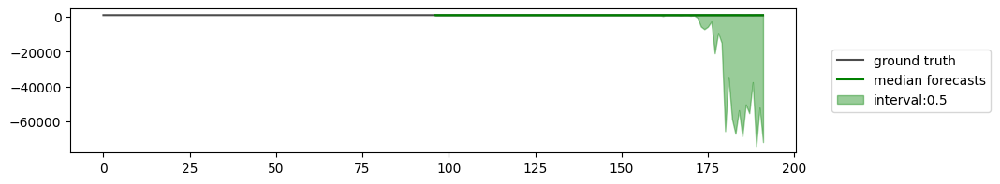

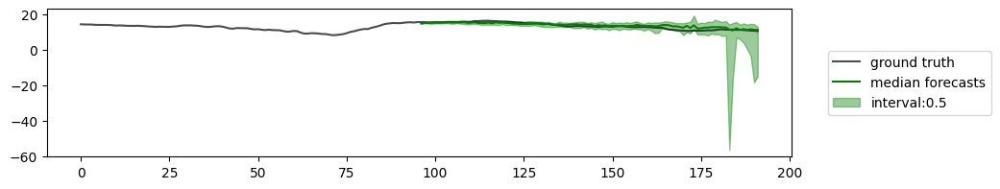

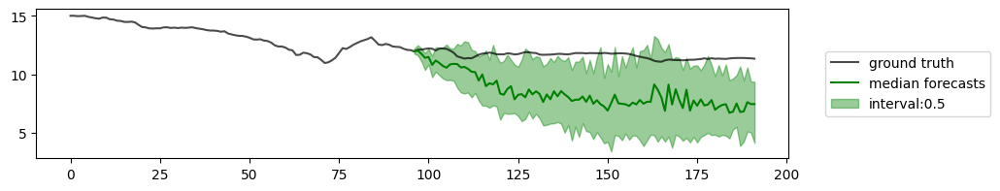

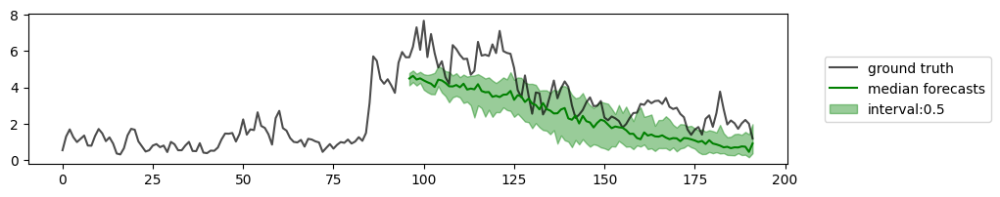

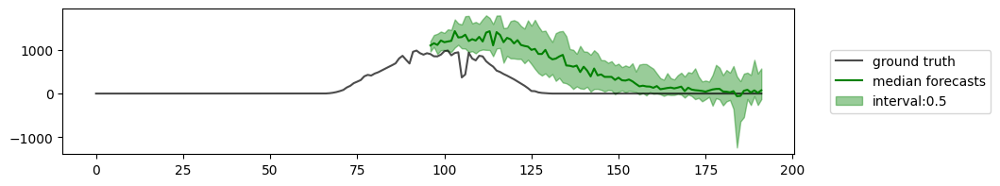

15


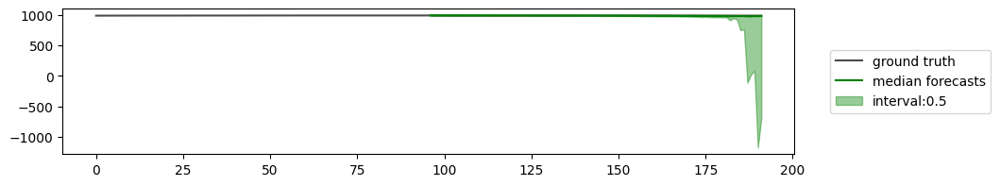

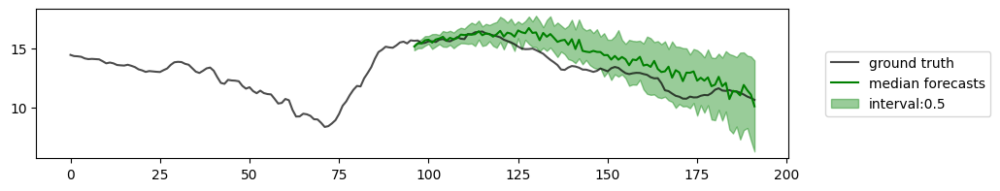

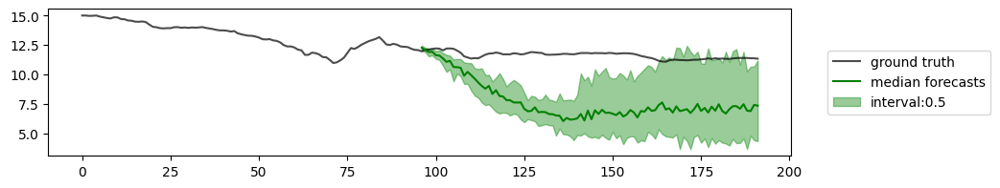

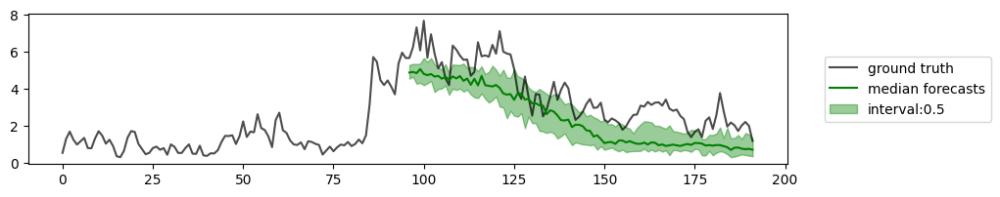

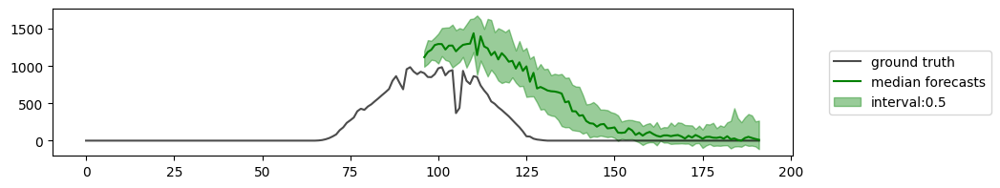

20


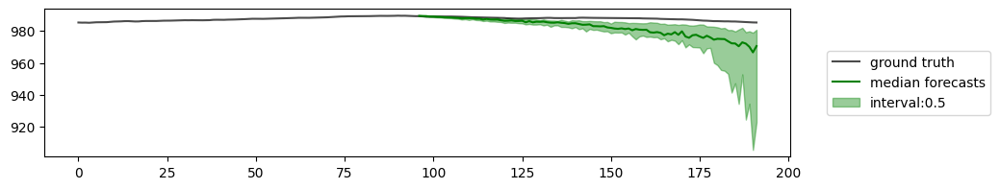

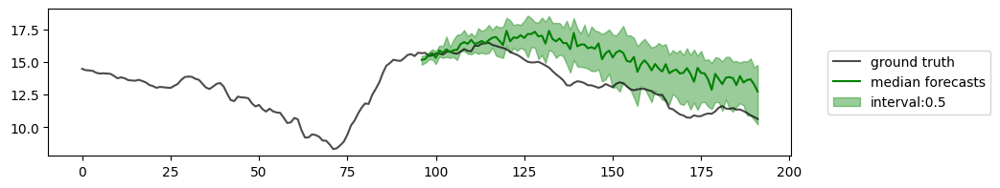

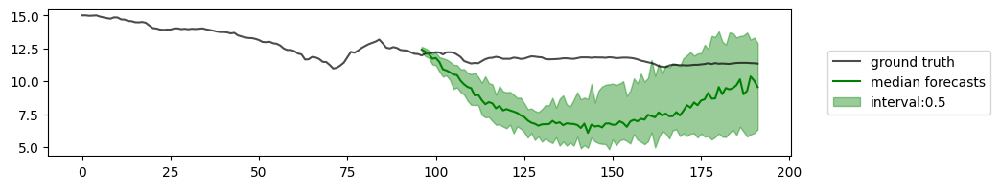

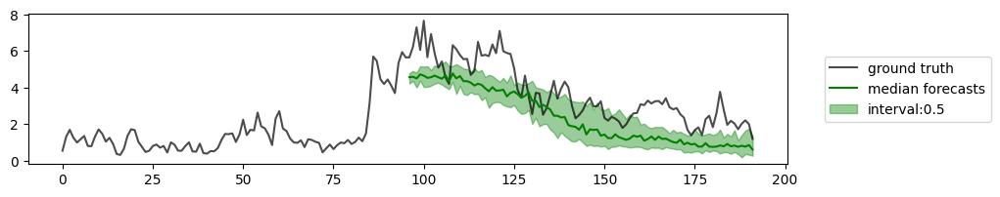

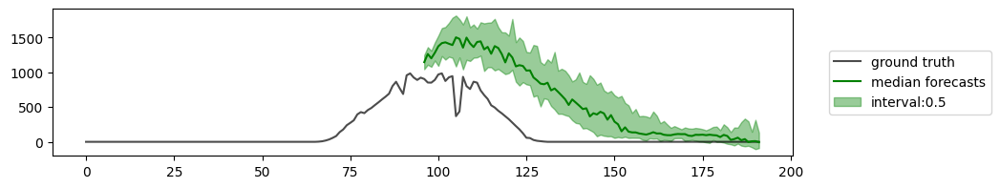

30


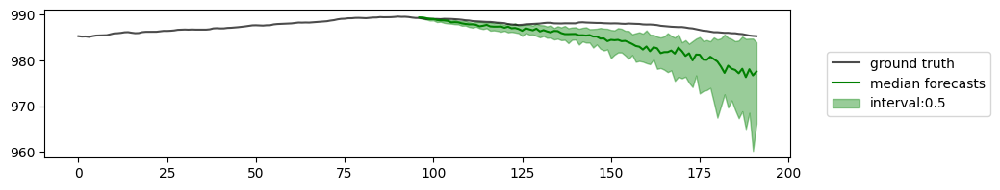

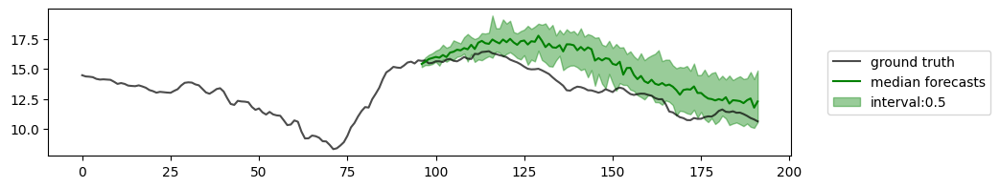

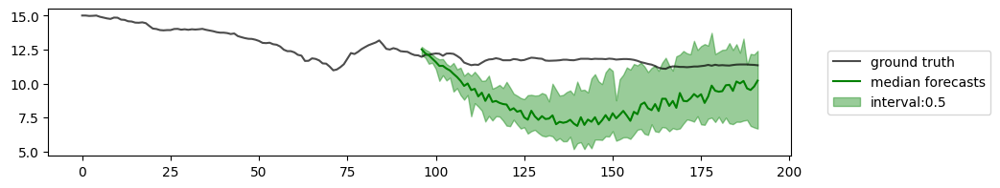

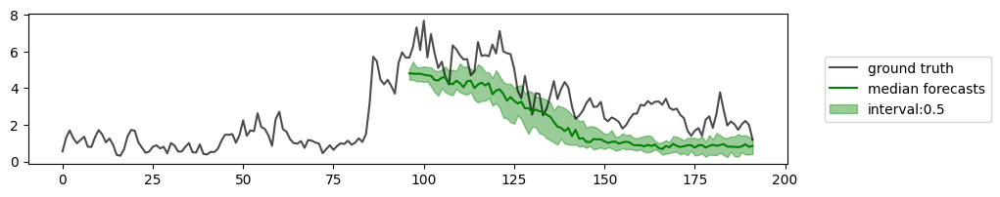

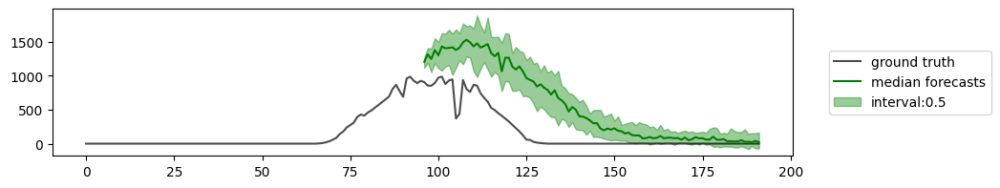

50


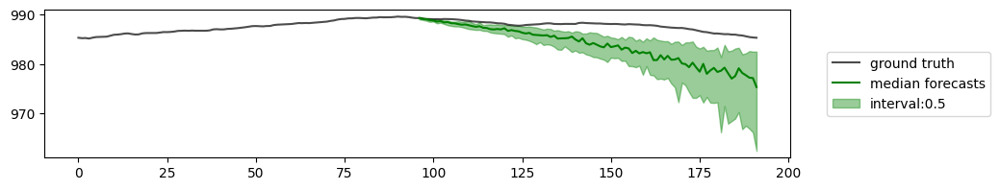

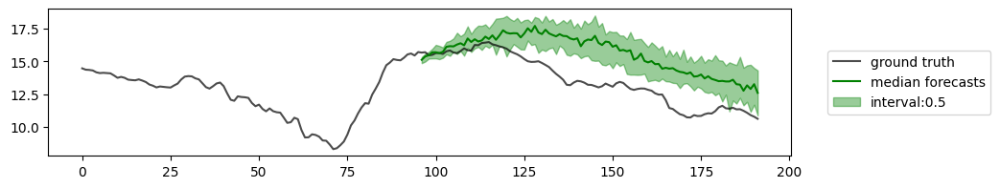

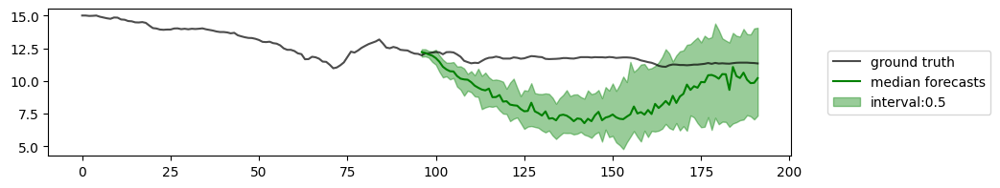

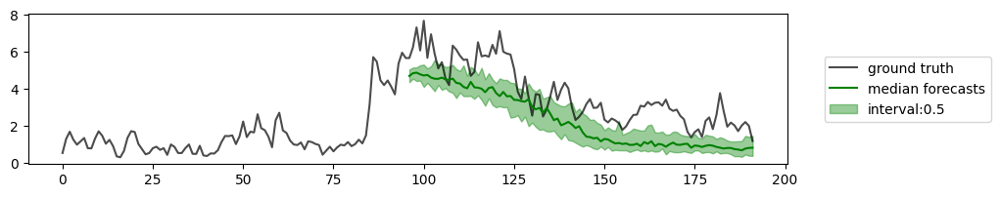

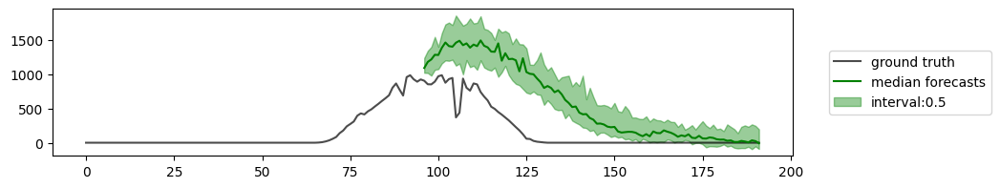

100


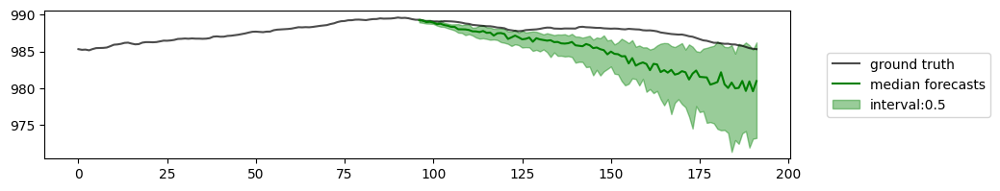

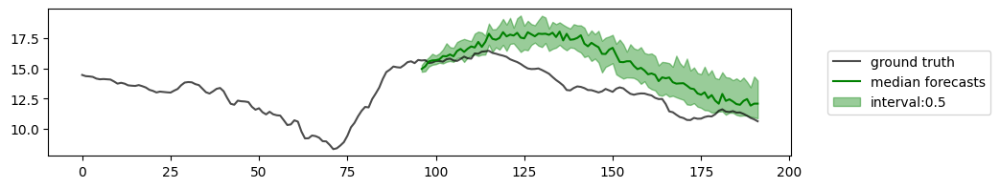

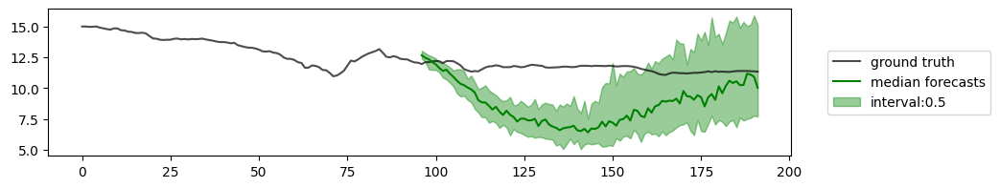

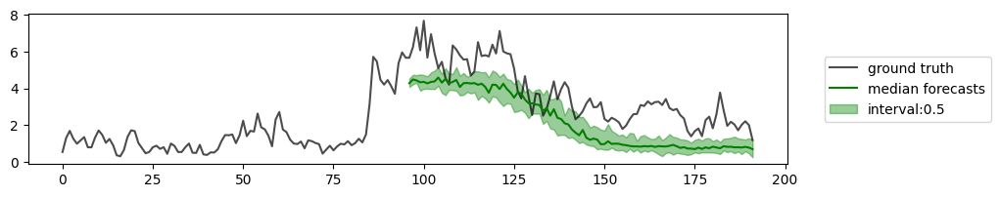

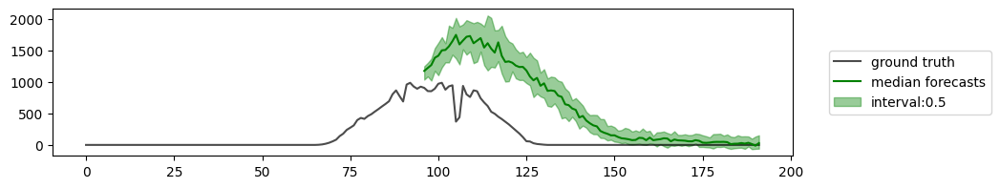

In [ ]:
model = model.to('cuda')
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96, point_type='median')
    plt.show()

### DPM-Solver-2

In [ ]:
model.forecaster.prob_model.solver = 'dpm2'

In [ ]:
model = model.to('cuda')
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.prob_model.solver_num_steps = num_steps // 2
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:45<00:00,  7.65s/it]


[1.8163070678710938,
 2.668492555618286,
 3.9342987537384033,
 6.083805561065674,
 10.366377115249634,
 21.046507596969604]

In [ ]:
dpm2_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[step // 2 for step in steps])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:55<04:35, 55.09s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS            6715.5087890625
    96_test_CRPS-Sum          6510.3740234375
      96_test_MASE              1271383.875
       96_test_MSE           17254710247424.0
     96_test_MSE-Sum        1267624163934208.0
       96_test_ND             8288.0126953125
     96_test_ND-Sum            9974.98046875
      96_test_NRMSE           24778.302734375
    96_test_NRMSE-Sum        10103.2373046875
   96_test_weighted_ND        8288.0126953125
 96_test_weighted_ND-Sum       9974.98046875
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [02:00<04:05, 61.40s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.8758432269096375
    96_test_CRPS-Sum         0.979045569896698
      96_test_MASE           143.413818359375
       96_test_MSE             15648429056.0
     96_test_MSE-Sum          368145399808.0
       96_test_ND           0.9666267037391663
     96_test_ND-Sum         1.0434927940368652
      96_test_NRMSE          712.6722412109375
    96_test_NRMSE-Sum         164.99365234375
   96_test_weighted_ND      0.9666267037391663
 96_test_weighted_ND-Sum    1.0434927940368652
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [03:22<03:32, 70.69s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.37563586235046387
    96_test_CRPS-Sum        0.3400452435016632
      96_test_MASE           57.15776062011719
       96_test_MSE             5347033600.0
     96_test_MSE-Sum          121570762752.0
       96_test_ND           0.5117251873016357
     96_test_ND-Sum         0.4635032117366791
      96_test_NRMSE          400.9928894042969
    96_test_NRMSE-Sum        91.07088470458984
   96_test_weighted_ND      0.5117251873016357
 96_test_weighted_ND-Sum    0.4635032117366791
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [05:10<02:51, 85.52s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.29490748047828674
    96_test_CRPS-Sum        0.25858160853385925
      96_test_MASE          48.987022399902344
       96_test_MSE             1656324864.0
     96_test_MSE-Sum           36500377600.0
       96_test_ND           0.41856178641319275
     96_test_ND-Sum          0.370745450258255
      96_test_NRMSE         205.69259643554688
    96_test_NRMSE-Sum        45.95417404174805
   96_test_weighted_ND      0.41856178641319275
 96_test_weighted_ND-Sum     0.370745450258255
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [07:52<01:52, 112.99s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.22997993230819702
    96_test_CRPS-Sum        0.19471479952335358
      96_test_MASE           45.30971145629883
       96_test_MSE             3899639296.0
     96_test_MSE-Sum           85118951424.0
       96_test_ND           0.3230329751968384
     96_test_ND-Sum         0.2756601572036743
      96_test_NRMSE          337.4832458496094
    96_test_NRMSE-Sum        74.91322326660156
   96_test_weighted_ND      0.3230329751968384
 96_test_weighted_ND-Sum    0.2756601572036743
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [12:47<00:00, 127.88s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.29542505741119385
    96_test_CRPS-Sum        0.23557370901107788
      96_test_MASE           52.29038619995117
       96_test_MSE              384036960.0
     96_test_MSE-Sum           8349544960.0
       96_test_ND           0.3584144711494446
     96_test_ND-Sum         0.28787288069725037
      96_test_NRMSE          89.9118423461914
    96_test_NRMSE-Sum       19.958498001098633
   96_test_weighted_ND      0.3584144711494446
 96_test_weighted_ND-Sum    0.28787288069725037
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [ ]:
import pickle
with open("dpm2_metrics.pkl", "wb") as fp:
   pickle.dump(dpm2_metrics, fp)

10


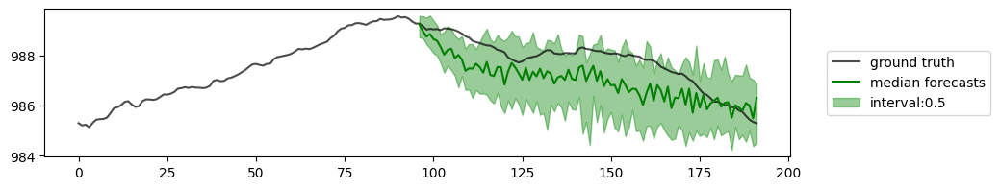

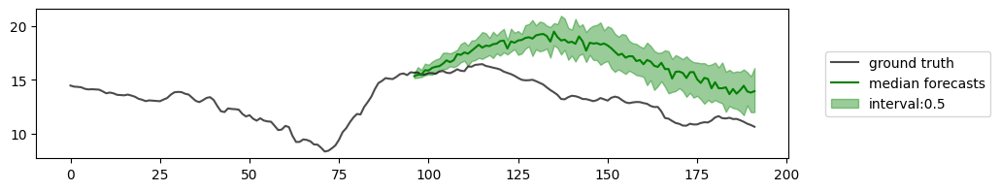

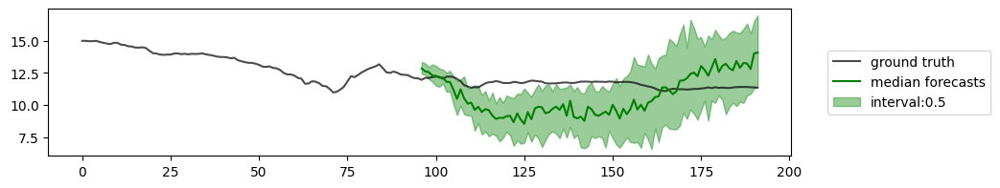

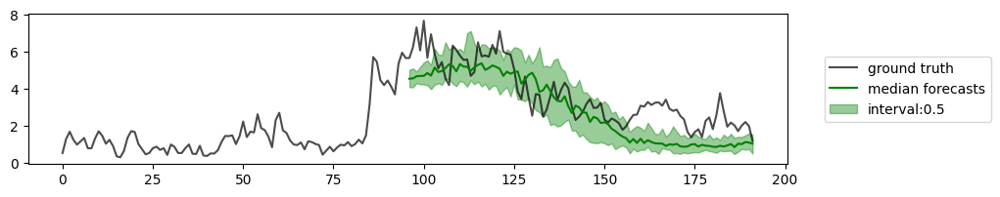

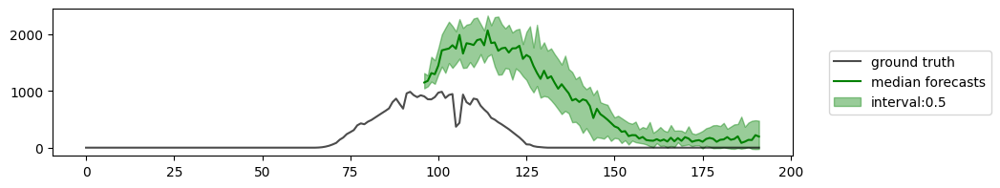

15


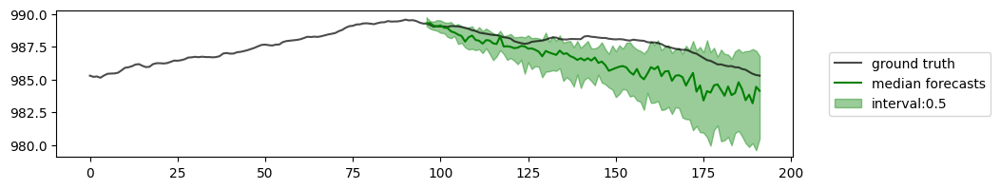

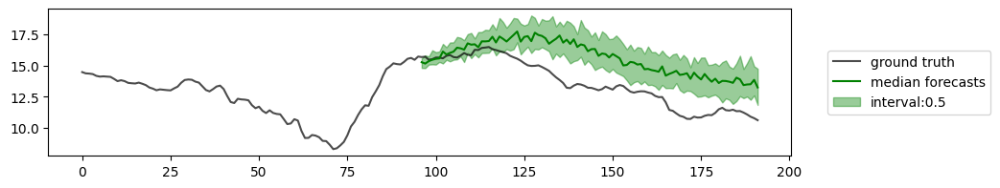

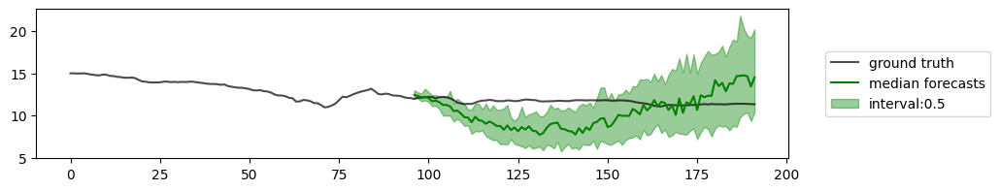

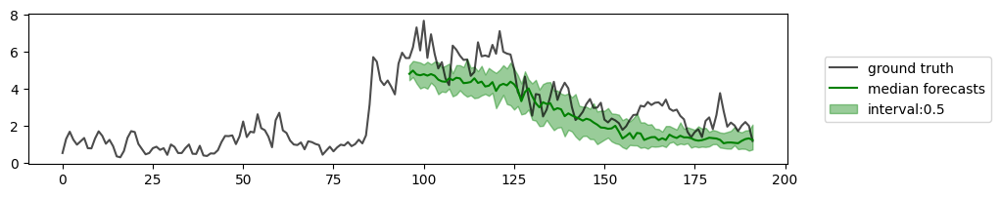

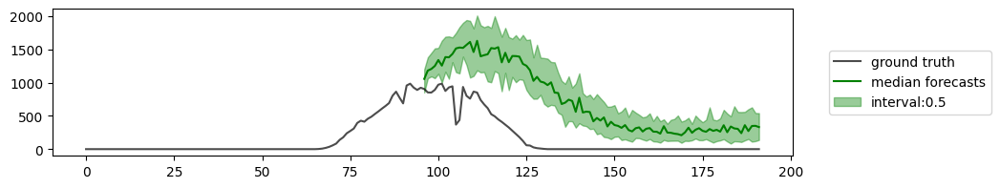

20


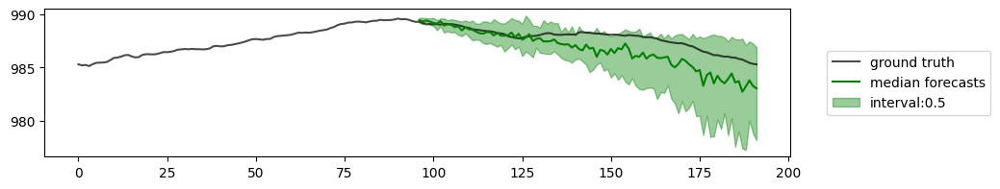

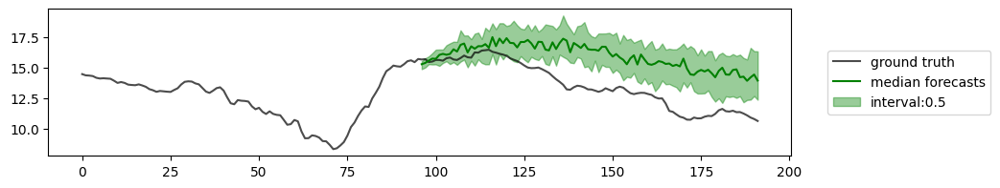

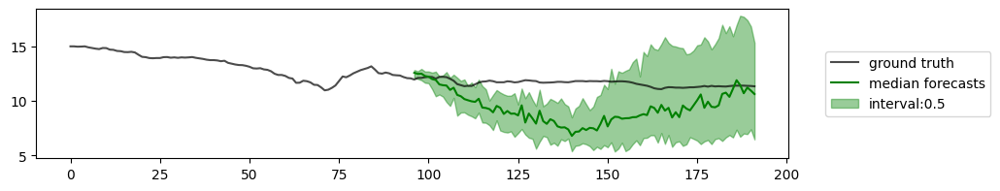

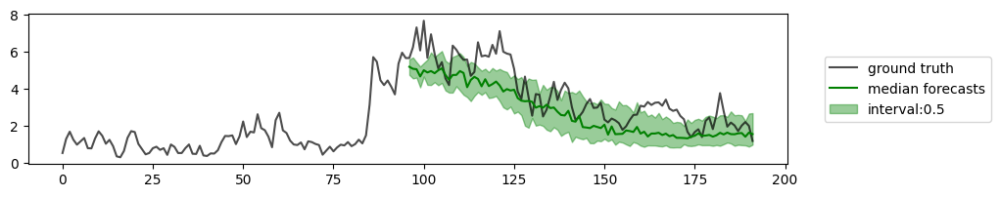

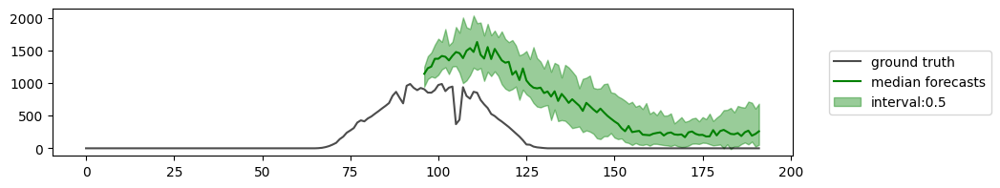

30


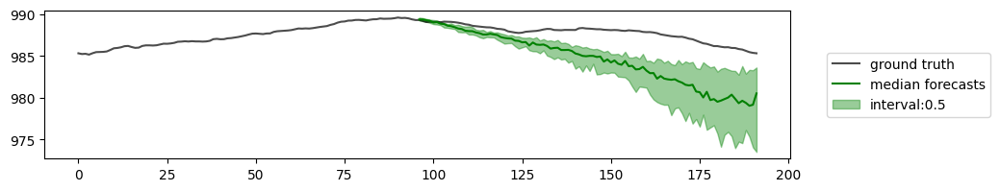

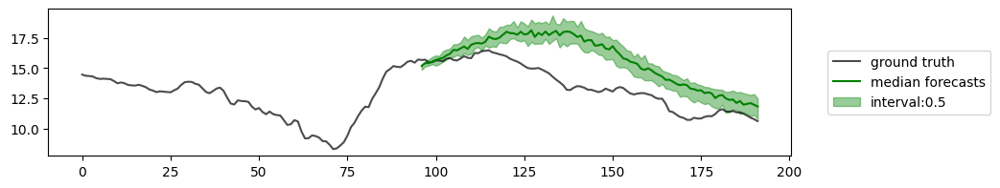

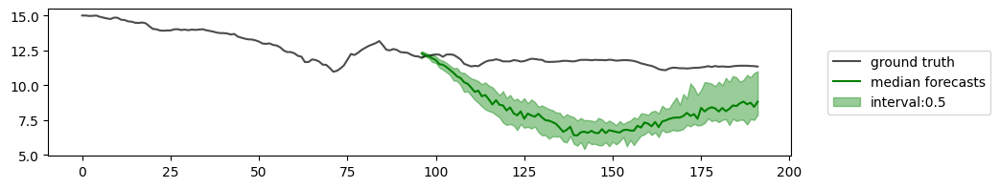

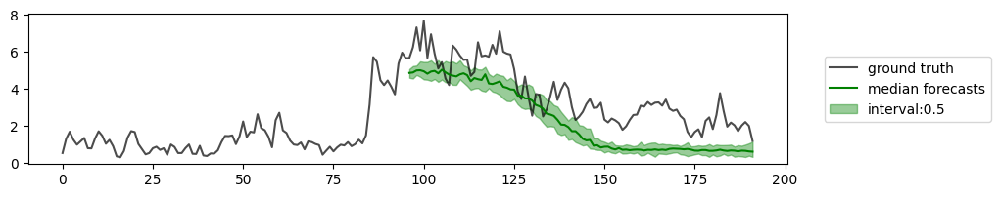

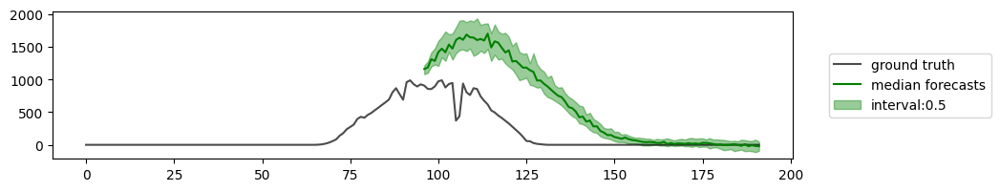

50


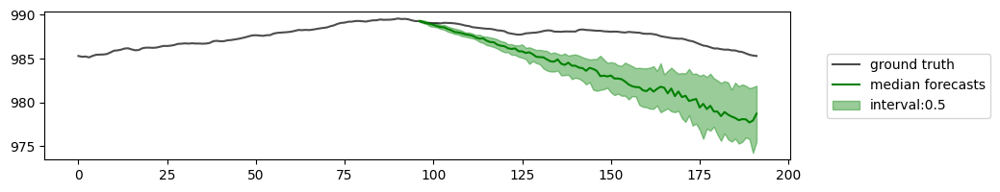

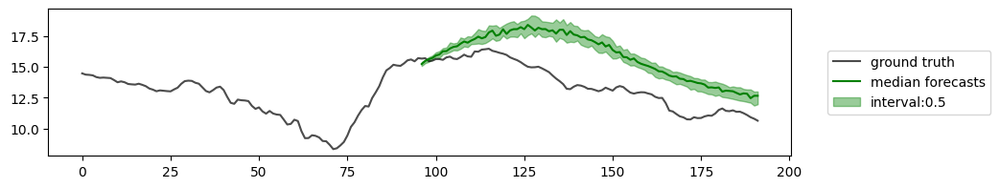

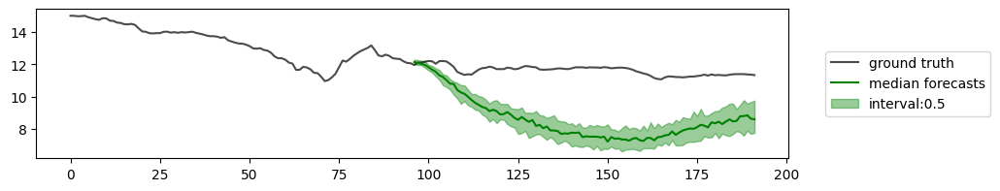

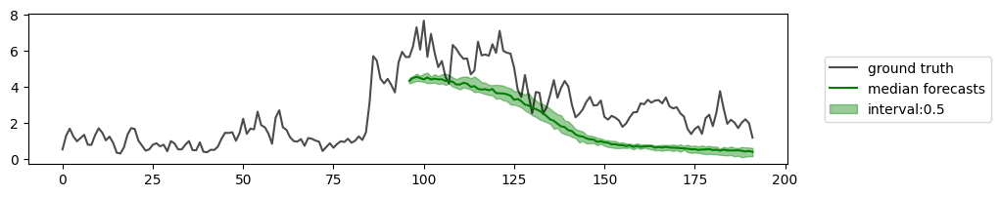

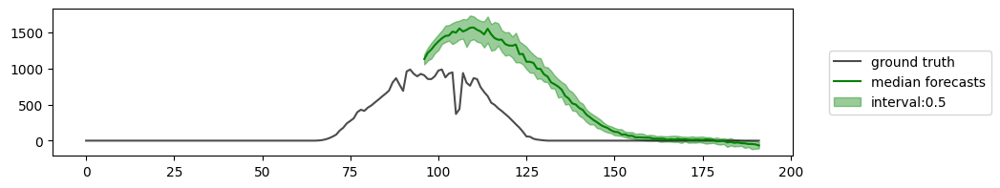

100


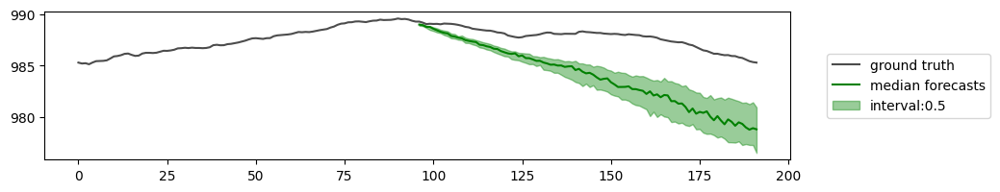

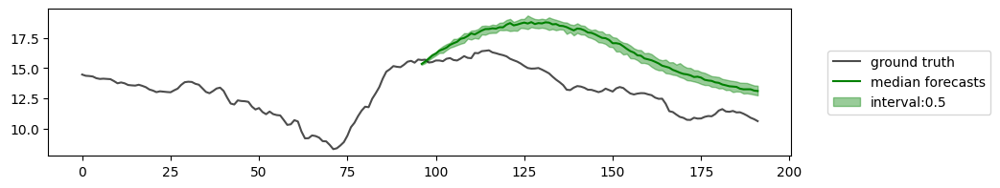

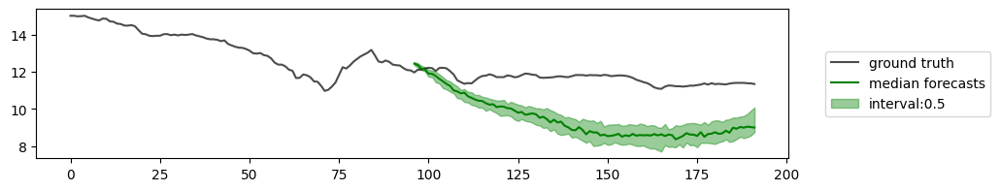

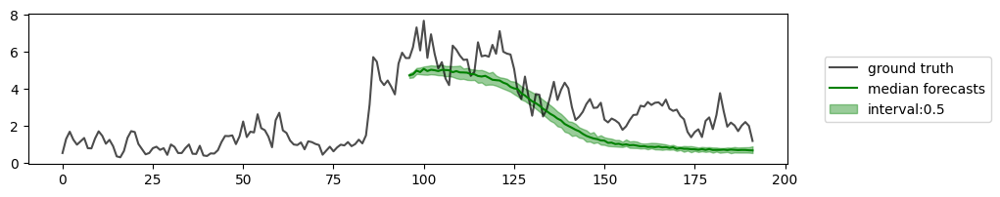

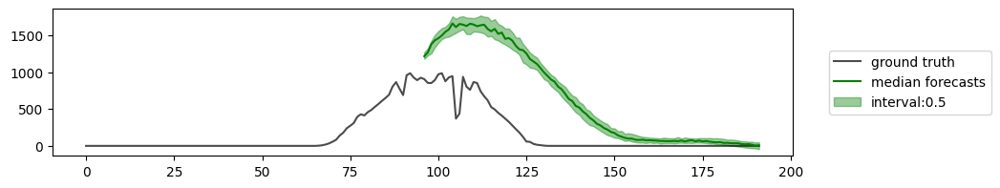

In [ ]:
model = model.to('cuda')
for num_steps in steps:
    print(num_steps)
    model.forecaster.prob_model.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96, point_type='median')
    plt.show()

### Plot results

In [2]:
import pickle
import os

metrics = {}
samplers_name = ['DDIM, linear', 'DDIM, quad', 'DPM-Solver-1', 'DPM-Solver-2', 'Euler', 'Heun']
i = 0
for file in sorted(os.listdir("samplers_res/")):
    if 'pkl' not in file:
        continue
    with open(f"samplers_res/{file}", "rb") as fp:
        metrics[samplers_name[i]] = pickle.load(fp)
    i += 1

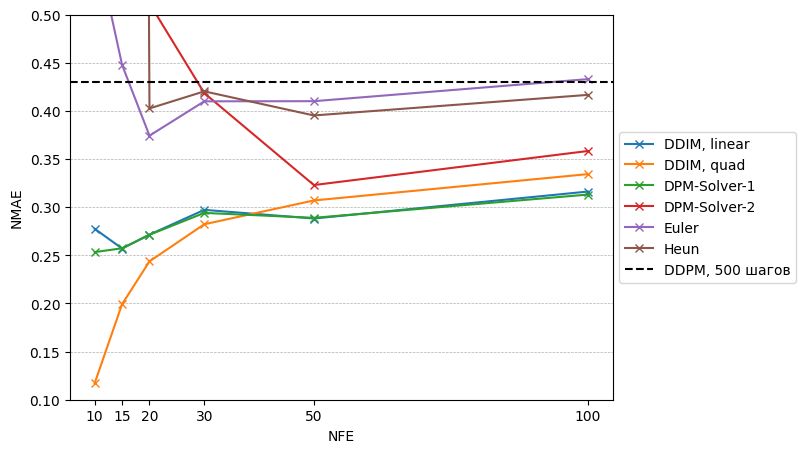

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    plt.plot(nfe, nmae, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.42968472838401794 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('NMAE')
plt.ylim(0.1, 0.5)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

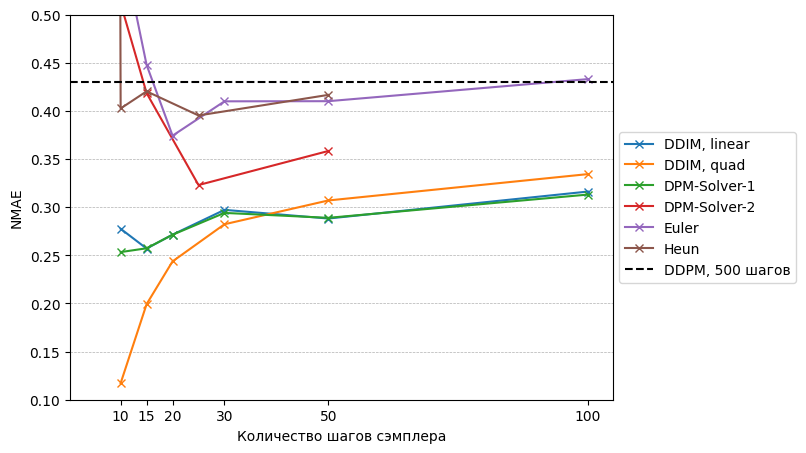

In [4]:
solver_steps = [10, 15, 20, 30, 50, 100]
solver_steps_2ord = [step // 2 for step in solver_steps]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(solver_steps_2ord, nmae, marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(solver_steps, nmae, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.42968472838401794 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('NMAE')
plt.ylim(0.1, 0.5)
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

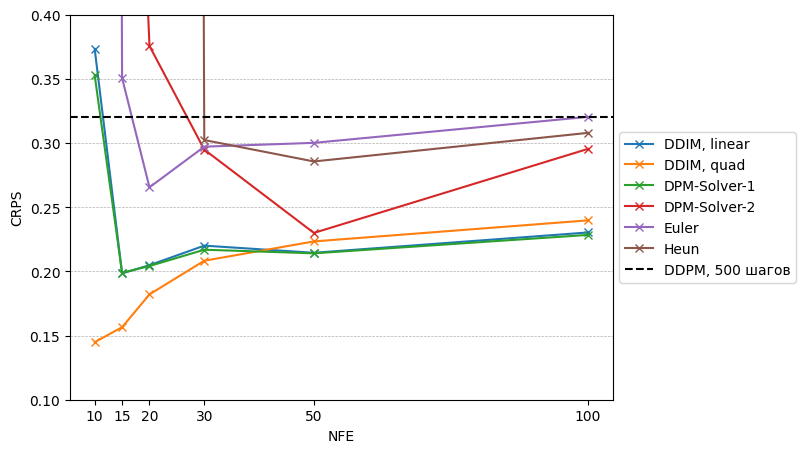

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    plt.plot(nfe, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.3204042315483093, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('CRPS')
plt.ylim(0.1, 0.4)
plt.yticks(np.arange(0.1, 0.4, 0.05))
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

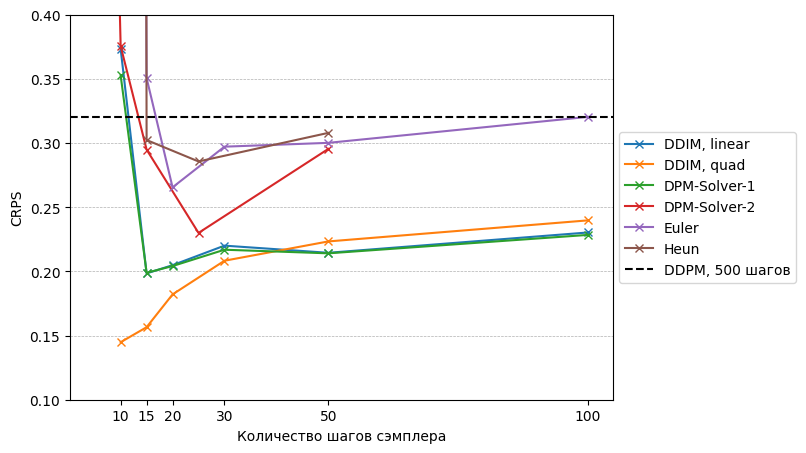

In [5]:
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(solver_steps_2ord, crps, marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(solver_steps, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.3204042315483093, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('CRPS')
plt.ylim(0.1, 0.4)
plt.yticks(np.arange(0.1, 0.4, 0.05))
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));
